In [1]:
its_jupyter_notebook = True

In [2]:
import pandas as pd
import os
import time
import numpy as np
import seaborn as sns
import pickle
import torch
from pathlib import Path
import argparse
import math
import matplotlib.pyplot as plt
import sys
from sklearn.metrics import classification_report, roc_curve, roc_auc_score, auc

sys.path.insert(0, '..')

from util.xai import gradcam, interpolate_expl_matrix, plot_matrix
from models.nt_classifier import build as build_model
from config import *
from util.plot_utils import obtain_plot, plot_logs, plot_roc_curves, collect_results_based_on_confidence_level
if its_jupyter_notebook:
    sys.argv = [''] #Remove this if it's not a jupyter notebook!

/data01/giorgio/ENTER/envs/rnarna/lib/python3.10/site-packages/torchvision/io/image.py:13: UserWarning: Failed to load image Python extension: /data01/giorgio/ENTER/envs/rnarna/lib/python3.10/site-packages/torchvision/image.so: undefined symbol: _ZN2at4_ops10select_int4callERKNS_6TensorEll
  warn(f"Failed to load image Python extension: {e}")


In [3]:
checkpoint_dir = os.path.join(ROOT_DIR, 'checkpoints', 'binary_cl2') #'binary_cl2')

In [4]:
file_train = os.path.join(rna_rna_files_dir, "gene_pairs_training_nt.txt")
with open(file_train, "rb") as fp:   # Unpickling
    gene_pairs_train = pickle.load(fp)
    
file_test = os.path.join(rna_rna_files_dir, "gene_pairs_test_nt.txt")
with open(file_test, "rb") as fp:   # Unpickling
    gene_pairs_test = pickle.load(fp)
    
file_test_subset = os.path.join(rna_rna_files_dir, "gene_pairs_test_sampled_nt.txt")
with open(file_test_subset, "rb") as fp:   # Unpickling
    gene_pairs_test_subset = pickle.load(fp)

In [5]:
test500 = pd.read_csv(os.path.join(metadata_dir, 'test500.csv'))

In [6]:
res = pd.read_csv(os.path.join(checkpoint_dir, 'test_results500.csv'))

print(classification_report(res.ground_truth, res.prediction))

              precision    recall  f1-score   support

           0       0.75      0.59      0.66     30829
           1       0.40      0.57      0.47     14569

    accuracy                           0.59     45398
   macro avg       0.57      0.58      0.57     45398
weighted avg       0.63      0.59      0.60     45398



# PLOTS

### Log plots

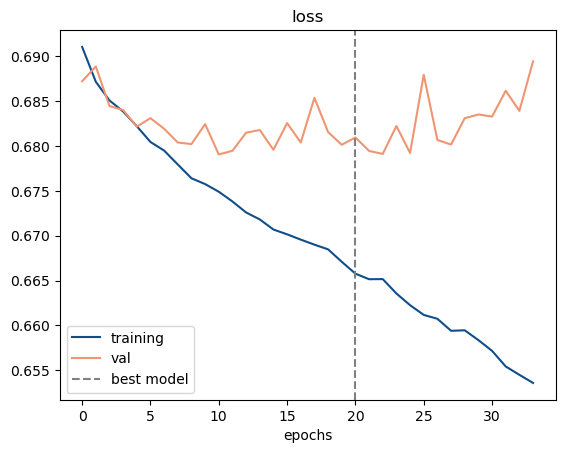

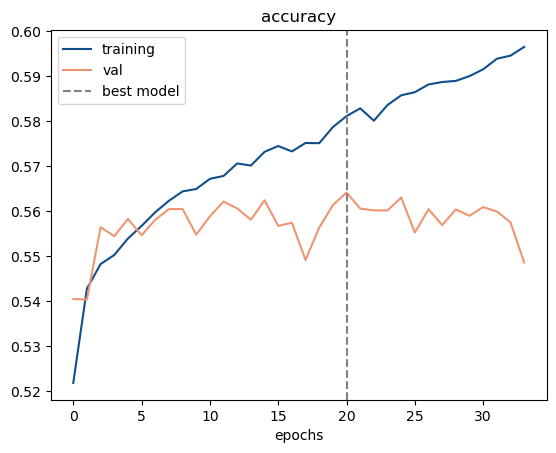

In [7]:
log = pd.read_json(Path(os.path.join(checkpoint_dir, 'log.txt')), lines=True)
best_model = np.argmax(log.test_accuracy)
for metric in ['loss', 'accuracy']:
    plot_logs(log, metric, best_model = best_model)

## Metrics

In [8]:
print(res.prediction.value_counts())
print('\n')
print(res.ground_truth.value_counts())

0    24433
1    20965
Name: prediction, dtype: int64


0    30829
1    14569
Name: ground_truth, dtype: int64


In [9]:
n_conf = 10

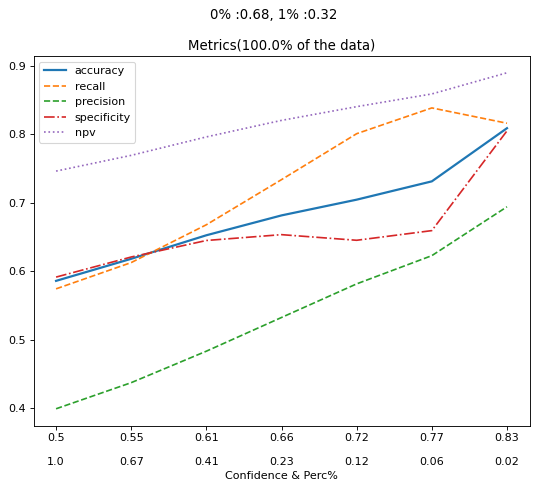

In [10]:
obtain_plot(res, n_original_df = res.shape[0], title = 'Metrics', n_conf = n_conf)

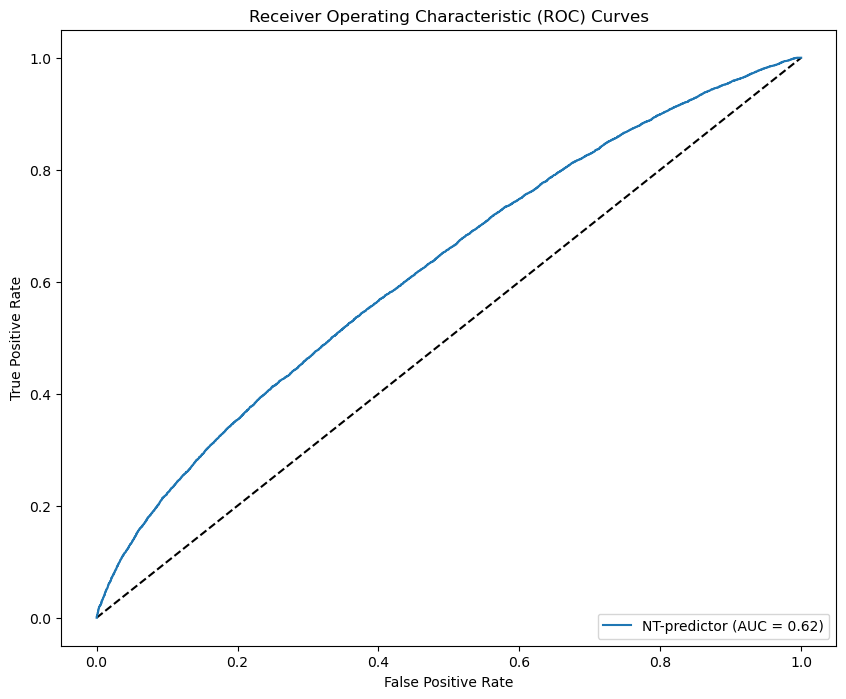

In [11]:
plot_roc_curves([{'prob': res.probability, 'model_name': 'NT-predictor'}], res.ground_truth)

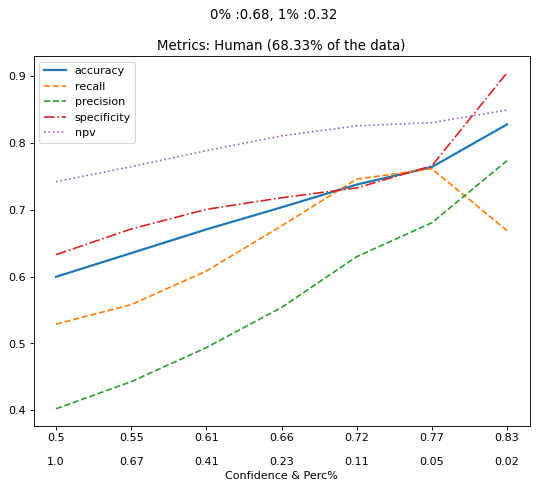

In [12]:
human = res[(res.specie == 'human')]
obtain_plot(human, n_original_df = res.shape[0], title = f'Metrics: Human ', n_conf = n_conf)

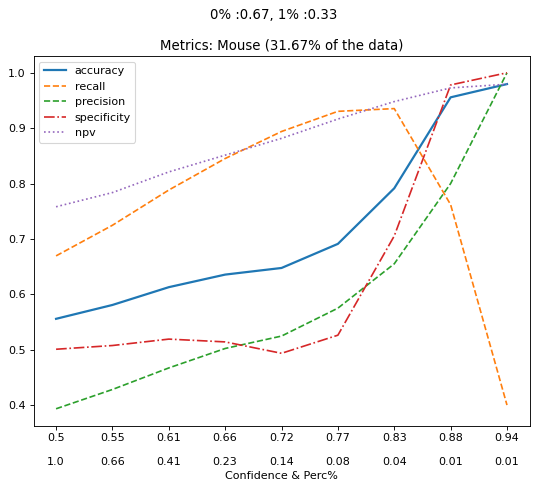

In [13]:
mouse = res[(res.specie == 'mouse')]
obtain_plot(mouse, n_original_df = res.shape[0], title = f'Metrics: Mouse ', n_conf = n_conf)

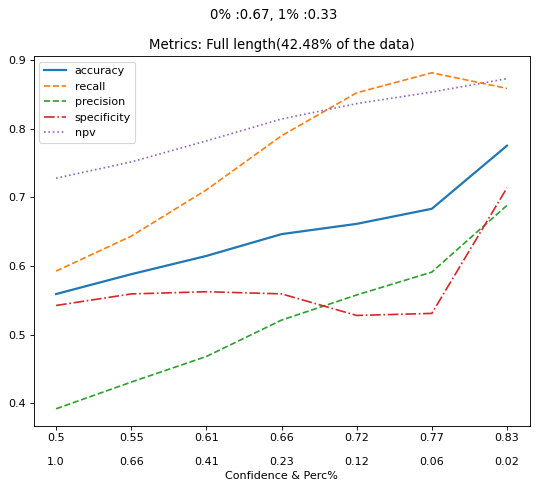

In [14]:
full_length = res[(res.original_length1 <= MAX_RNA_SIZE)&(res.original_length2 <= MAX_RNA_SIZE)]
obtain_plot(full_length, n_original_df = res.shape[0], title = f'Metrics: Full length', n_conf = 10)

In [15]:
confidence_level = 0.65
high_conf_fl = full_length[(full_length.probability>confidence_level)|(full_length.probability<(1-confidence_level))]

In [16]:
(high_conf_fl.ground_truth == high_conf_fl.prediction).sum() / high_conf_fl.shape[0]

0.636486747920294

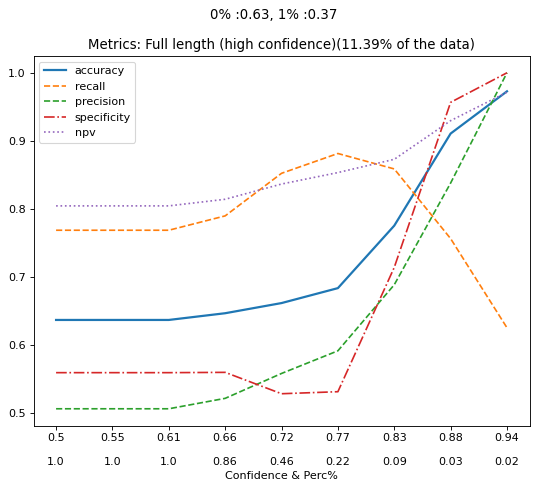

In [17]:
confidence_level = 0.65
high_conf_fl = full_length[(full_length.probability>confidence_level)|(full_length.probability<(1-confidence_level))]
obtain_plot(high_conf_fl, n_original_df = res.shape[0], title = f'Metrics: Full length (high confidence)', n_conf = n_conf)

In [18]:
# big_area_size = res.sampled_area.quantile(0.9)
# big_area_size = 5000**2
# big_area = res[res['sampled_area'] > big_area_size]

# obtain_plot(big_area, n_original_df = res.shape[0], title = f'Metrics: Big area', n_conf = n_conf)

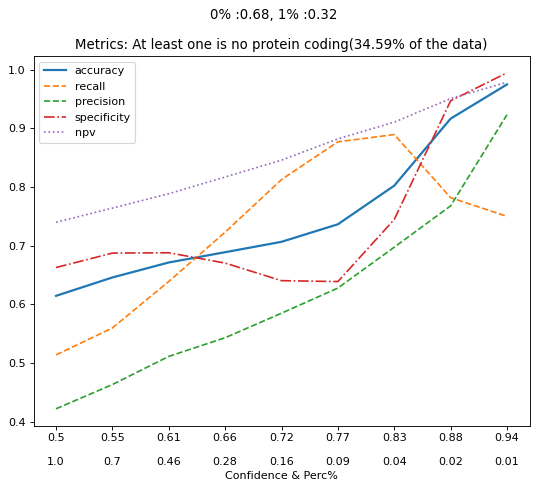

In [19]:
no_pc = res[(res['gene1_pc'] == False)|(res['gene2_pc'] == False)]

obtain_plot(no_pc, n_original_df = res.shape[0], title = f'Metrics: At least one is no protein coding', n_conf = n_conf)

In [20]:
test = pd.read_csv(os.path.join(metadata_dir, f'test_sampled.csv'))
print(test.interacting.value_counts())
test = test[['id_gene1_sample', 'id_gene2_sample']]

False    14569
True     14569
Name: interacting, dtype: int64


In [21]:
res1 = res.merge(test, left_on = ['g1', 'g2'], right_on = ['id_gene1_sample', 'id_gene2_sample'])
res2 = res.merge(test, left_on = ['g1', 'g2'], right_on = ['id_gene2_sample', 'id_gene1_sample'])
easypos_smartneg = pd.concat([res1, res2], axis = 0)
easypos_smartneg.ground_truth.value_counts()

1    14577
0    14570
Name: ground_truth, dtype: int64

In [22]:
# subset_test_nt_sampled = os.path.join(rna_rna_files_dir, f"gene_pairs_test_sampled_nt.txt")
# with open(subset_test_nt_sampled, "rb") as fp:  # Unpickling
#     subset_test_nt_sampled = pickle.load(fp)
    
# easypos_smartneg = res[res.id_sample.isin(subset_test_nt_sampled)]

0.5909356022918311


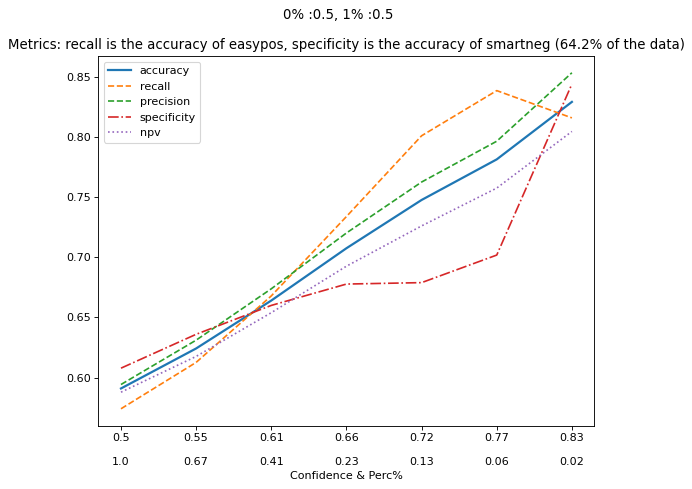

In [23]:
# vc = easypos_smartneg.ground_truth.value_counts()
# assert vc.loc[1] > vc.loc[0]
# n_to_exclude = vc.loc[1] - vc.loc[0]
# easypos_gt = easypos_smartneg[easypos_smartneg.ground_truth==1]
# id_to_exclude = list(easypos_gt.sample(frac = 1).head(n_to_exclude).id_sample)
# easypos_smartneg_sampled = easypos_smartneg[~easypos_smartneg.id_sample.isin(id_to_exclude)]

easypos_smartneg_sampled = easypos_smartneg
print((easypos_smartneg_sampled.prediction == easypos_smartneg_sampled.ground_truth).sum()/easypos_smartneg_sampled.shape[0])
obtain_plot(easypos_smartneg_sampled, n_original_df = res.shape[0], title = f'Metrics: recall is the accuracy of easypos, specificity is the accuracy of smartneg ', n_conf = n_conf)

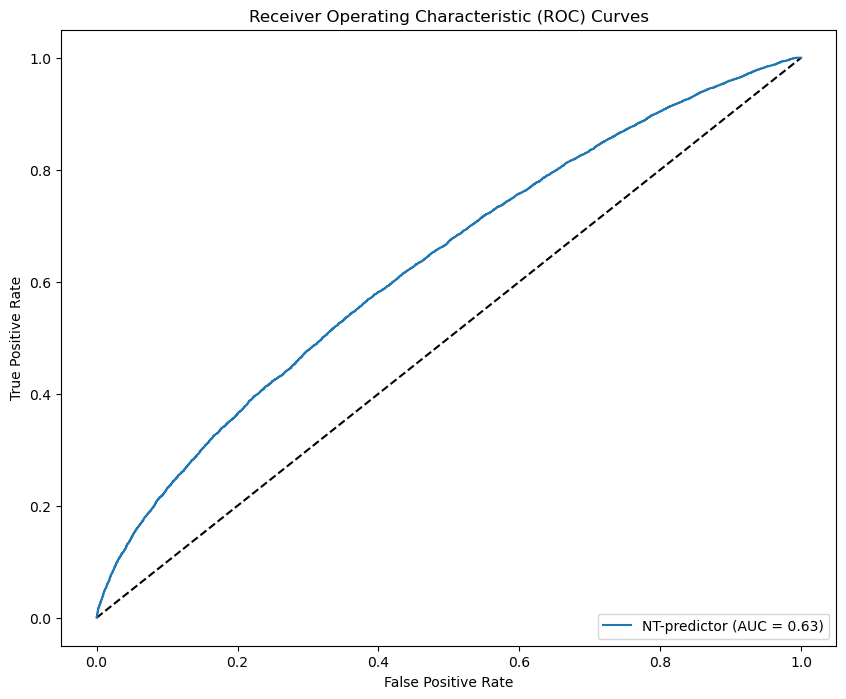

In [24]:
plot_roc_curves([{'prob': easypos_smartneg_sampled.probability, 'model_name': 'NT-predictor'}], easypos_smartneg_sampled.ground_truth)

0.7318376068376068


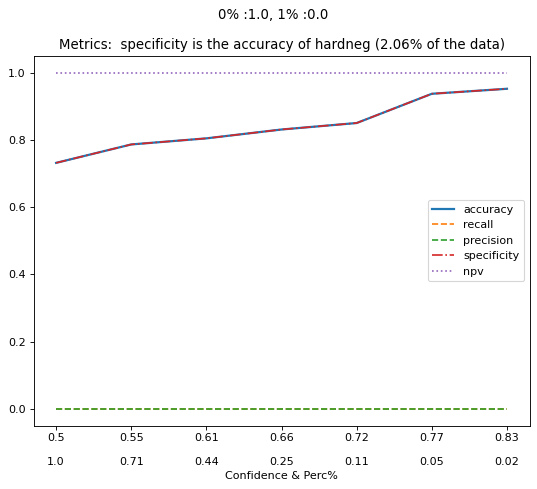

In [25]:
hn = res[(res.policy == 'hardneg')]
print(hn[hn.ground_truth == hn.prediction].shape[0]/hn.shape[0])

obtain_plot(hn, n_original_df = res.shape[0], title = f'Metrics:  specificity is the accuracy of hardneg ', n_conf = n_conf)

0.7557726465364121


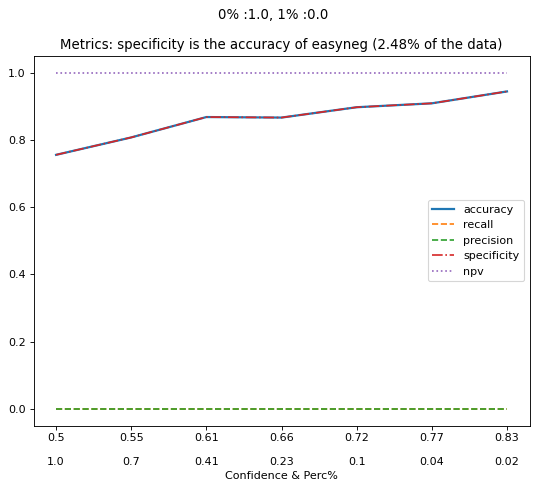

In [26]:
easy = res[(res.policy == 'easyneg')]
print(easy[easy.ground_truth == easy.prediction].shape[0]/easy.shape[0])

obtain_plot(easy, n_original_df = res.shape[0], title = f'Metrics: specificity is the accuracy of easyneg ', n_conf = n_conf)

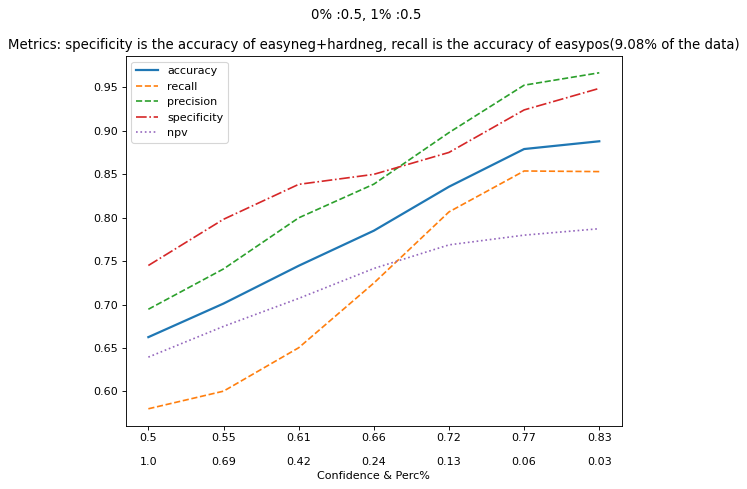

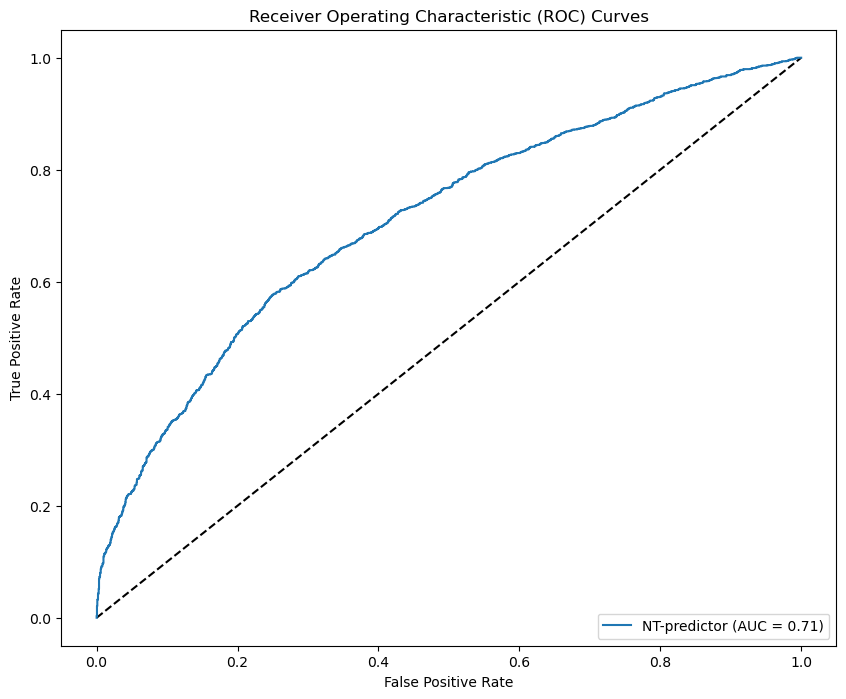

In [27]:
ephnen = res[(res.policy == 'easyneg')|(res.policy == 'easypos')|(res.policy == 'hardneg')]

vc = ephnen.ground_truth.value_counts()
assert vc.loc[1] > vc.loc[0]
n_to_exclude = vc.loc[1] - vc.loc[0]
ephnen_gt = ephnen[ephnen.ground_truth==1]
id_to_exclude = list(ephnen_gt.sample(frac = 1).head(n_to_exclude).id_sample)
ephnen_sampled = ephnen[~ephnen.id_sample.isin(id_to_exclude)]

obtain_plot(ephnen_sampled, n_original_df = res.shape[0], title = f'Metrics: specificity is the accuracy of easyneg+hardneg, recall is the accuracy of easypos', n_conf = n_conf)
plot_roc_curves([{'prob': ephnen_sampled.probability, 'model_name': 'NT-predictor'}], ephnen_sampled.ground_truth)

/tmp/ipykernel_574185/84461656.py:1: DtypeWarning: Columns (21) have mixed types. Specify dtype option on import or set low_memory=False.
  df_nt = pd.read_csv(os.path.join(metadata_dir, f'df_nt.csv'))


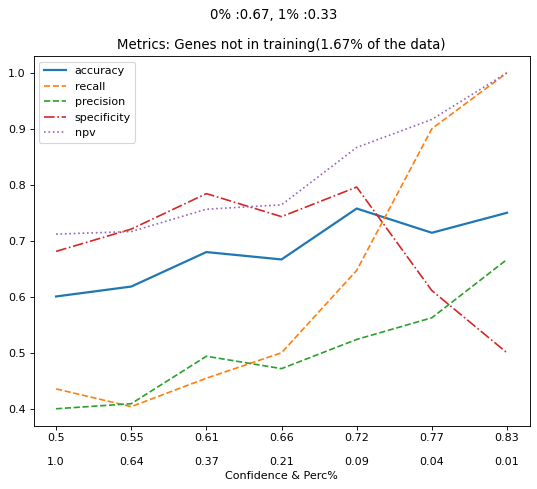

In [28]:
df_nt = pd.read_csv(os.path.join(metadata_dir, f'df_nt.csv'))
regex = df_nt[df_nt.couples.isin(gene_pairs_train)].couples_id.str.extractall('(.*)_(.*)').reset_index()
df_train = regex
df_train['g1'] = regex[0]
df_train['g2'] = regex[1]
df_train_genes = set(df_train['g1']).union(set(df_train['g2']))

not_in_train = res[~(res.gene1_original.isin(df_train_genes) | res.gene2_original.isin(df_train_genes))]

obtain_plot(not_in_train, n_original_df = res.shape[0], title = f'Metrics: Genes not in training', n_conf = n_conf)

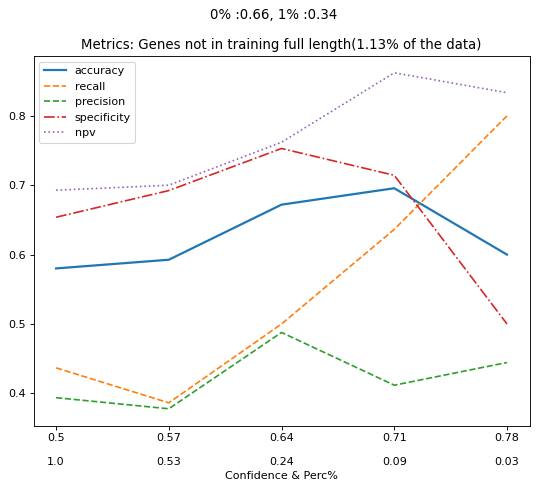

In [29]:
not_in_train_fl = not_in_train[(not_in_train.original_length1 <= MAX_RNA_SIZE)&(not_in_train.original_length2 <= MAX_RNA_SIZE)]
not_in_train_fl = not_in_train_fl[(not_in_train_fl.policy == 'easypos')|(not_in_train_fl.policy == 'smartneg')]
obtain_plot(not_in_train_fl, n_original_df = res.shape[0], title = f'Metrics: Genes not in training full length', n_conf = 8)

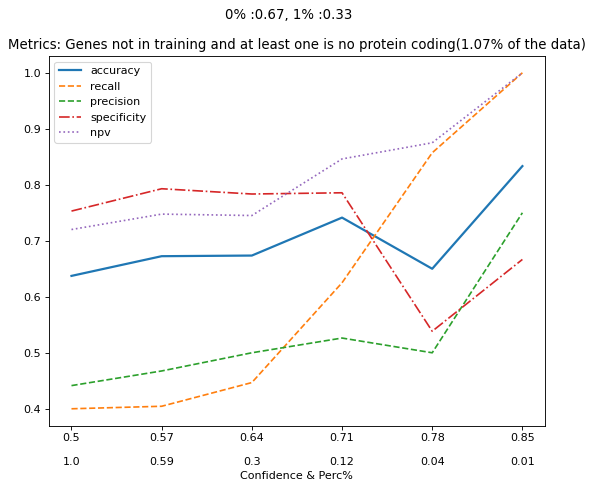

In [30]:
no_pc_no_train = not_in_train[(not_in_train['gene1_pc'] == False)|(not_in_train['gene2_pc'] == False)]

obtain_plot(no_pc_no_train, n_original_df = res.shape[0], title = f'Metrics: Genes not in training and at least one is no protein coding', n_conf = 8)

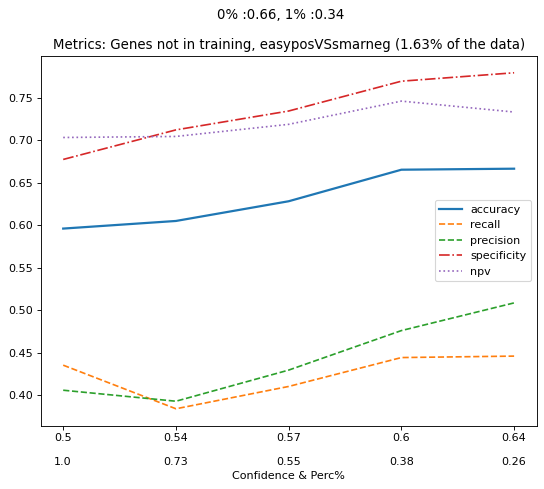

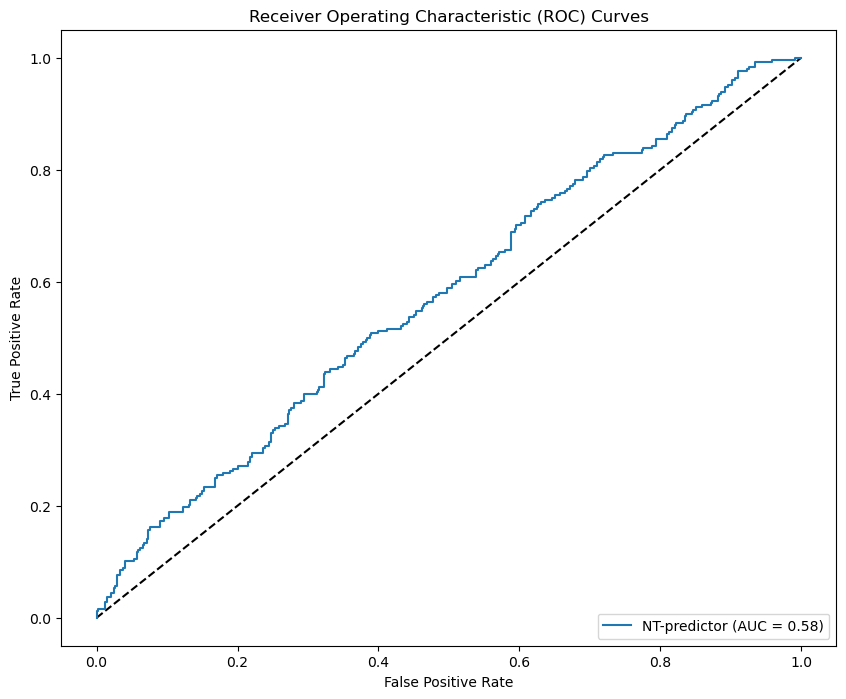

In [31]:
not_in_train_epsn = not_in_train[(not_in_train.policy == 'easypos')|(not_in_train.policy == 'smartneg')]
obtain_plot(not_in_train_epsn, n_original_df = res.shape[0], title = f'Metrics: Genes not in training, easyposVSsmarneg ', n_conf = 15, excluding_treshold = 0.2)
plot_roc_curves([{'prob': not_in_train_epsn.probability, 'model_name': 'NT-predictor'}], not_in_train_epsn.ground_truth)

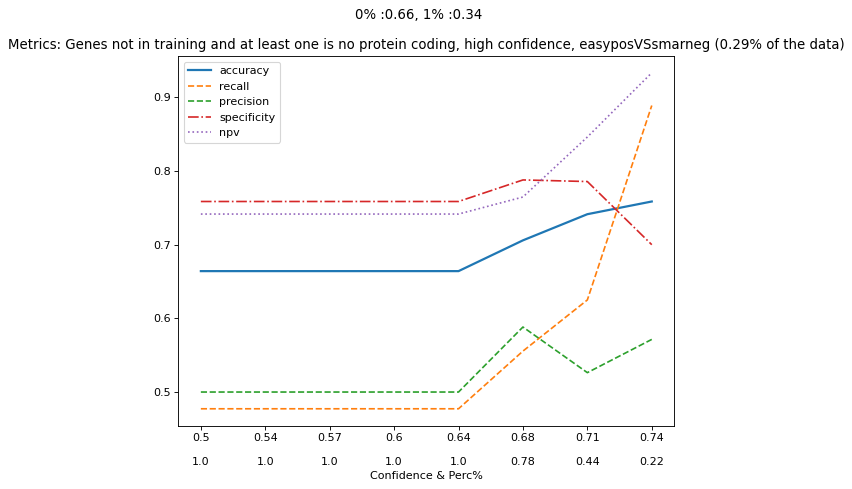

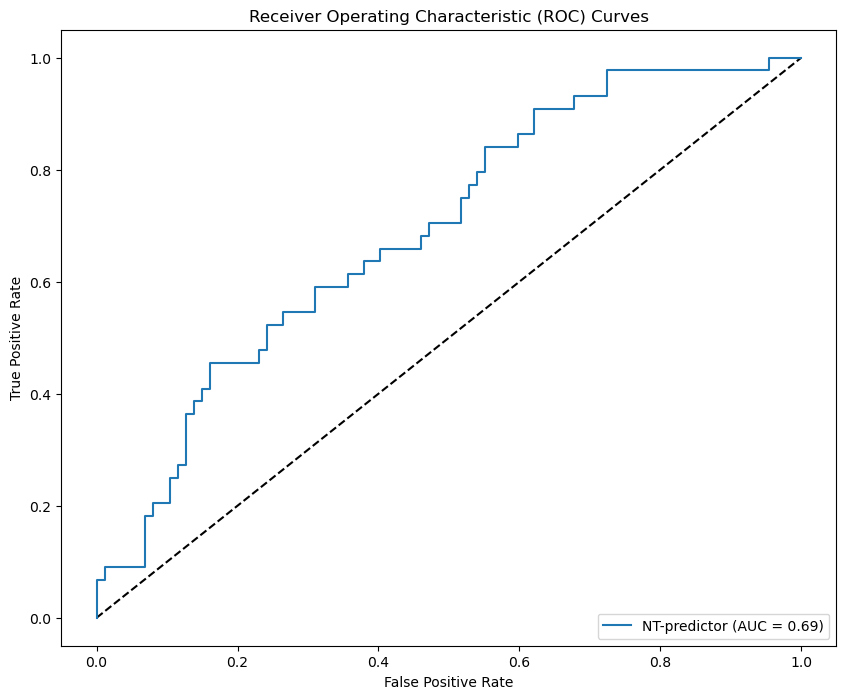

In [32]:
confidence_level = 0.65

no_pc_no_train = not_in_train[(not_in_train['gene1_pc'] == False)|(not_in_train['gene2_pc'] == False)]
no_pc_no_train = no_pc_no_train[(no_pc_no_train.probability>confidence_level)|(no_pc_no_train.probability<(1-confidence_level))]
no_pc_no_train = no_pc_no_train[(no_pc_no_train.policy == 'easypos')|(no_pc_no_train.policy == 'smartneg')]
obtain_plot(no_pc_no_train, n_original_df = res.shape[0], title = f'Metrics: Genes not in training and at least one is no protein coding, high confidence, easyposVSsmarneg ', n_conf = 15, excluding_treshold = 0.2)
plot_roc_curves([{'prob': no_pc_no_train.probability, 'model_name': 'NT-predictor'}], no_pc_no_train.ground_truth)

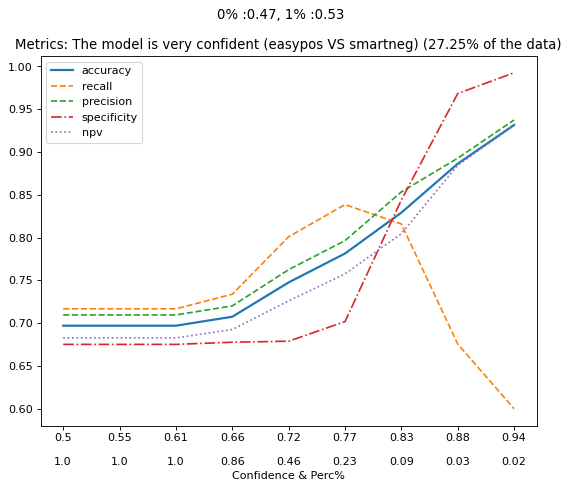

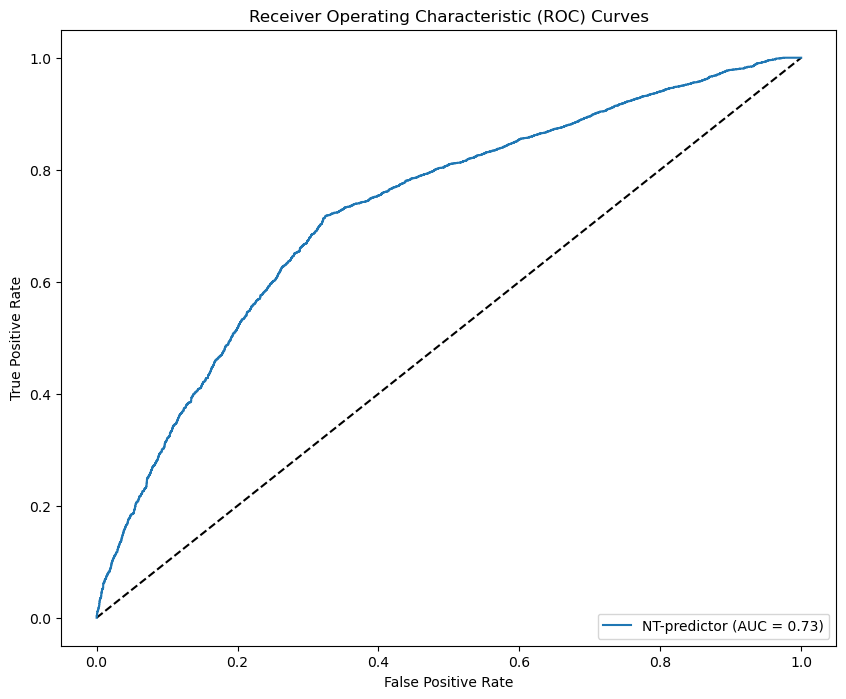

In [33]:
confidence_level = 0.65
high_prob_pairs = easypos_smartneg[(easypos_smartneg.probability>confidence_level)|(easypos_smartneg.probability<(1-confidence_level))]

obtain_plot(high_prob_pairs, n_original_df = easypos_smartneg.shape[0], title = f'Metrics: The model is very confident (easypos VS smartneg) ', n_conf = n_conf)
plot_roc_curves([{'prob': high_prob_pairs.probability, 'model_name': 'NT-predictor'}], high_prob_pairs.ground_truth)

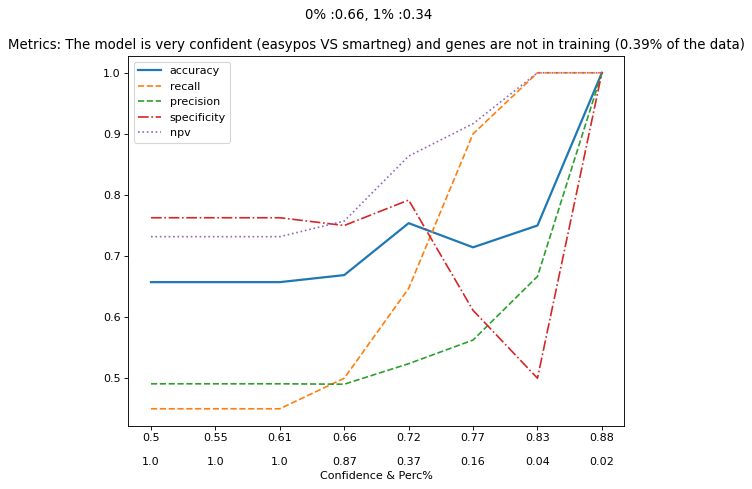

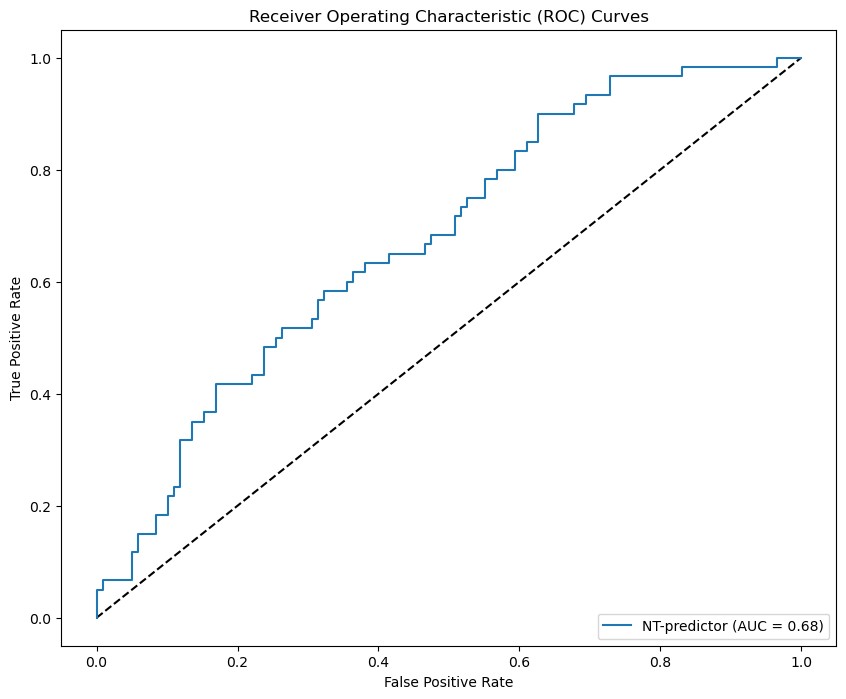

In [34]:
confidence_level = 0.65
high_prob_pairs = not_in_train[(not_in_train.probability>confidence_level)|(not_in_train.probability<(1-confidence_level))]
high_prob_pairs = high_prob_pairs[(high_prob_pairs.policy == 'easypos')|(high_prob_pairs.policy == 'smartneg')]

obtain_plot(high_prob_pairs, n_original_df = res.shape[0], title = f'Metrics: The model is very confident (easypos VS smartneg) and genes are not in training ', n_conf = n_conf)
plot_roc_curves([{'prob': high_prob_pairs.probability, 'model_name': 'NT-predictor'}], high_prob_pairs.ground_truth)

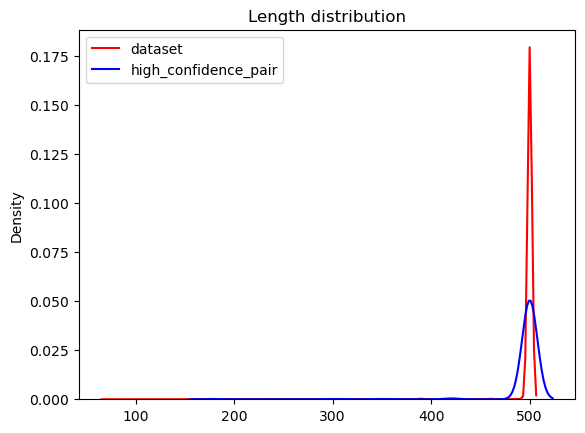

In [35]:
sns.kdeplot(list(pd.concat([easypos_smartneg.len_g1, easypos_smartneg.len_g2], axis = 0)), color = 'red', label = 'dataset')
sns.kdeplot(list(pd.concat([high_prob_pairs.len_g1, high_prob_pairs.len_g2], axis = 0)), color = 'blue', label = 'high_confidence_pair')
plt.title(f'Length distribution')
plt.legend()

# Compare with INTARNA

In [36]:
intarna = pd.read_csv(os.path.join(intarna_dir, 'test500', 'test.csv'), sep = ';')
intarna['key'] = intarna.id1 + '_' + intarna.id2

# keep only the lower E_norm for each group
intarna.sort_values('E_norm', ascending = False, inplace=True)
intarna.drop_duplicates(subset='key', keep='first', inplace=True)
intarna = intarna.reset_index(drop = True)
intarna['couples'] = intarna.id1.str.extractall('(.*)_(.*)').reset_index(drop = True)[0]
intarna['couples'] = intarna['couples'].astype(int)

# #merge with id of df_nt
# df_nt = pd.read_csv(os.path.join(metadata_dir, f'df_nt.csv'))
# df_nt = df_nt[['couples', 'interacting']]
# df_nt['interacting'] = df_nt['interacting'].astype(int)

In [37]:
res = res.merge(intarna[['E','E_norm', 'couples']].rename({'couples':'id_sample'}, axis =1), on = 'id_sample')

In [38]:
intarna.shape[0]

45398

In [39]:
res.shape[0]

45398

In [40]:
auc_nt = []
auc_intarna = []

for i in range(500):
    # undersample 0 class
    res0 = res[res.ground_truth == 0]
    res1 = res[res.ground_truth == 1]
    balanced = pd.concat([res0.sample(res1.shape[0]), res1], axis = 0)

    fpr, tpr, _ = roc_curve(balanced.ground_truth, balanced.probability)
    roc_auc = auc(fpr, tpr)
    auc_nt.append(roc_auc)
    
    fpr, tpr, _ = roc_curve(abs(1 - balanced.ground_truth), balanced.E_norm)
    roc_auc = auc(fpr, tpr)
    auc_intarna.append(roc_auc)

In [41]:
print(np.mean(auc_nt), 
      np.mean(auc_intarna)
     )

0.6225559977474534 0.5366236242040092


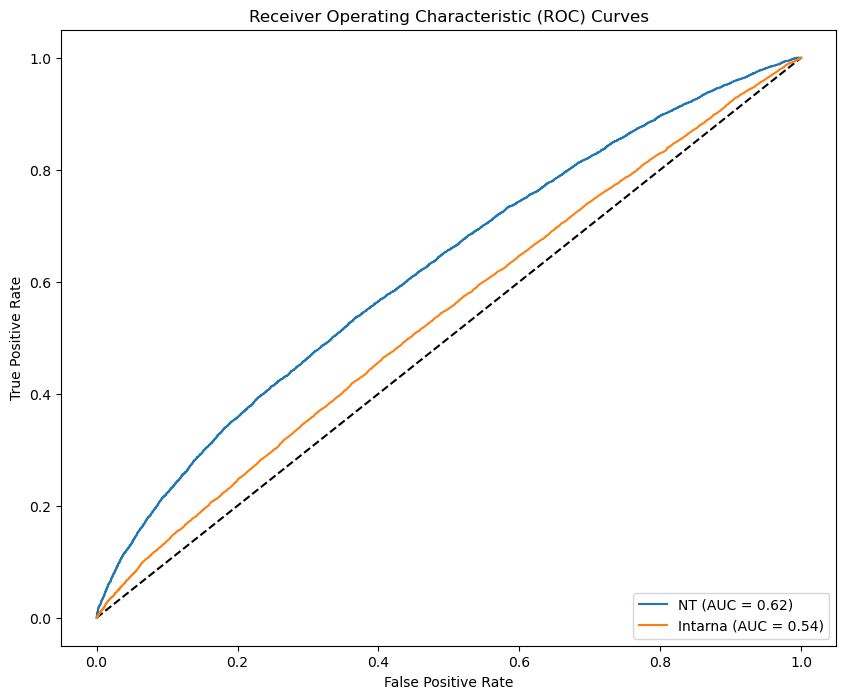

In [42]:
plot_roc_curves([{'prob': balanced.probability, 'model_name': 'NT'},
                 {'prob': abs(balanced.E_norm), 'model_name': 'Intarna'}
                ], balanced.ground_truth)

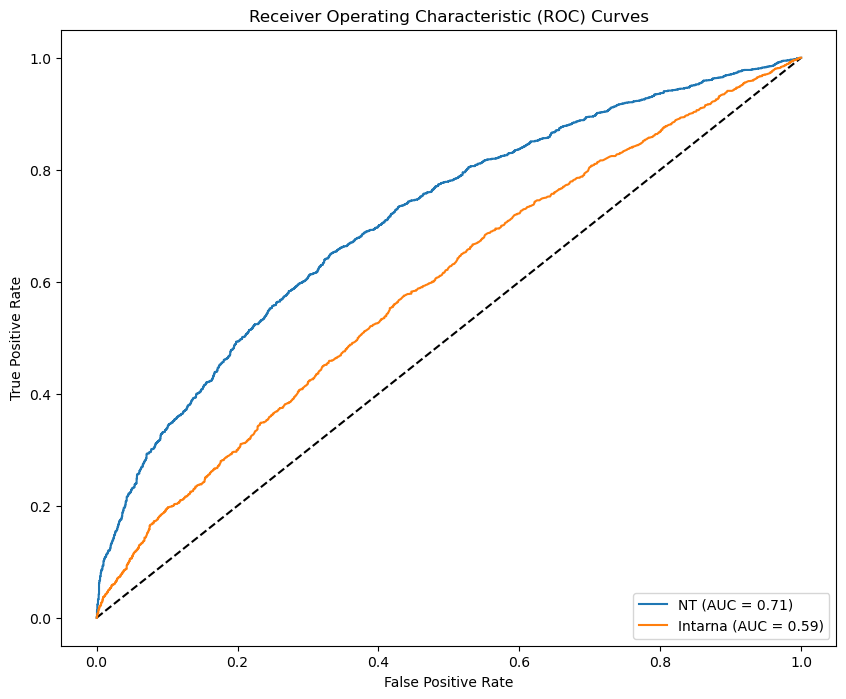

In [43]:
ephnen = res[(res.policy == 'easyneg')|(res.policy == 'easypos')|(res.policy == 'hardneg')]

vc = ephnen.ground_truth.value_counts()
assert vc.loc[1] > vc.loc[0]
n_to_exclude = vc.loc[1] - vc.loc[0]
ephnen_gt = ephnen[ephnen.ground_truth==1]
id_to_exclude = list(ephnen_gt.sample(frac = 1).head(n_to_exclude).id_sample)
ephnen_sampled = ephnen[~ephnen.id_sample.isin(id_to_exclude)]

plot_roc_curves([{'prob': ephnen_sampled.probability, 'model_name': 'NT'},
                 {'prob': abs(ephnen_sampled.E_norm), 'model_name': 'Intarna'}
                ], ephnen_sampled.ground_truth)

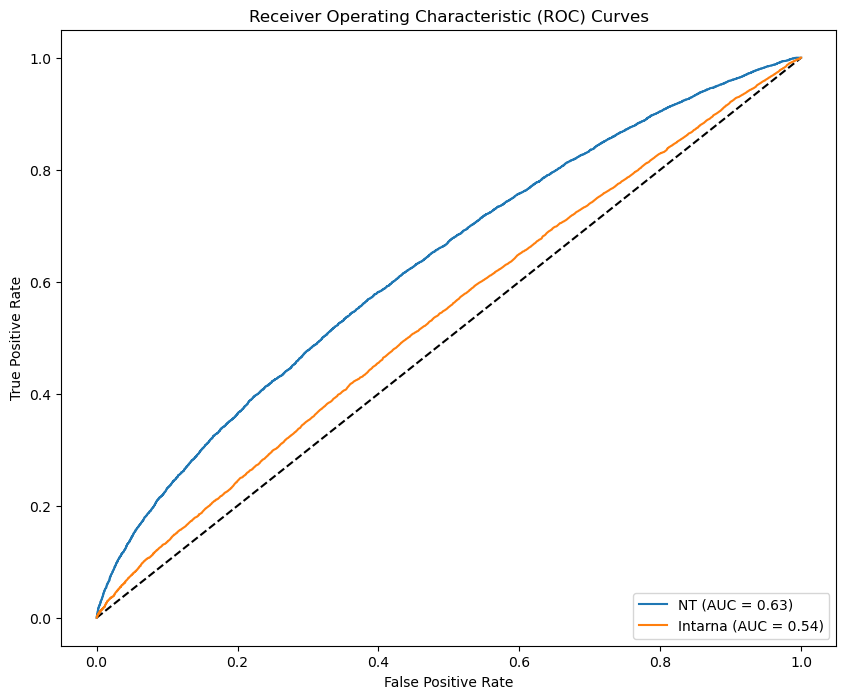

In [44]:
test = pd.read_csv(os.path.join(metadata_dir, f'test_sampled.csv'))
test = test[['id_gene1_sample', 'id_gene2_sample']]

res1 = res.merge(test, left_on = ['g1', 'g2'], right_on = ['id_gene1_sample', 'id_gene2_sample'])
res2 = res.merge(test, left_on = ['g1', 'g2'], right_on = ['id_gene2_sample', 'id_gene1_sample'])
easypos_smartneg = pd.concat([res1, res2], axis = 0)
easypos_smartneg.ground_truth.value_counts()

plot_roc_curves([{'prob': easypos_smartneg.probability, 'model_name': 'NT'},
                 {'prob': abs(easypos_smartneg.E_norm), 'model_name': 'Intarna'}
                ], easypos_smartneg.ground_truth)

#### Compare AUC based on confidence

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


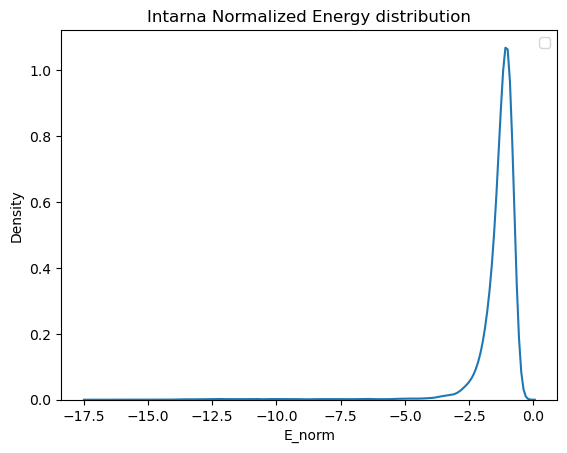

In [45]:
sns.kdeplot(easypos_smartneg.E_norm)
plt.title(f'Intarna Normalized Energy distribution')
plt.legend()
plt.show()

In [46]:
def plot_ROC_based_on_confidence(df, how = 'intarna', treshold = 0.05):
    if how == 'intarna':
        subset = df[
            (df.E_norm <= df.E_norm.quantile(treshold))|
            (df.E_norm >= df.E_norm.quantile(1-treshold))
        ]
    elif how == 'nt':
        subset = df[
            (df.probability <= treshold)|
            (df.probability >= (1-treshold))
        ]
    else:
        raise NotImplementedError
    print('perc of the total data: ', np.round(subset.shape[0]/df.shape[0], 3)*100, '%')
    plot_roc_curves([{'prob': subset.probability, 'model_name': 'NT'},
                 {'prob': abs(subset.E_norm), 'model_name': 'Intarna'}
                ], subset.ground_truth)

perc of the total data:  2.0 %


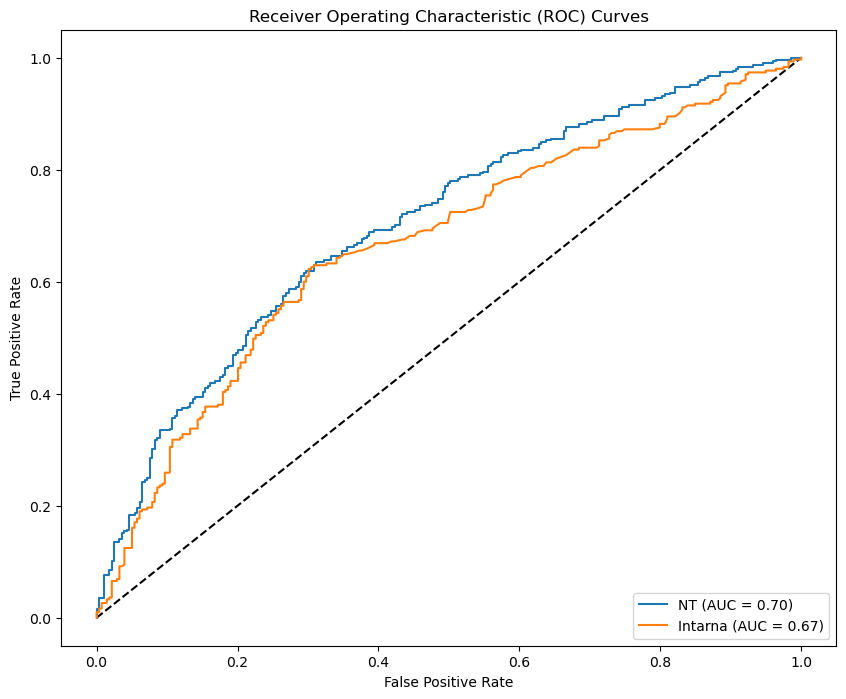

In [47]:
plot_ROC_based_on_confidence(easypos_smartneg, treshold = 0.01)

perc of the total data:  8.3 %


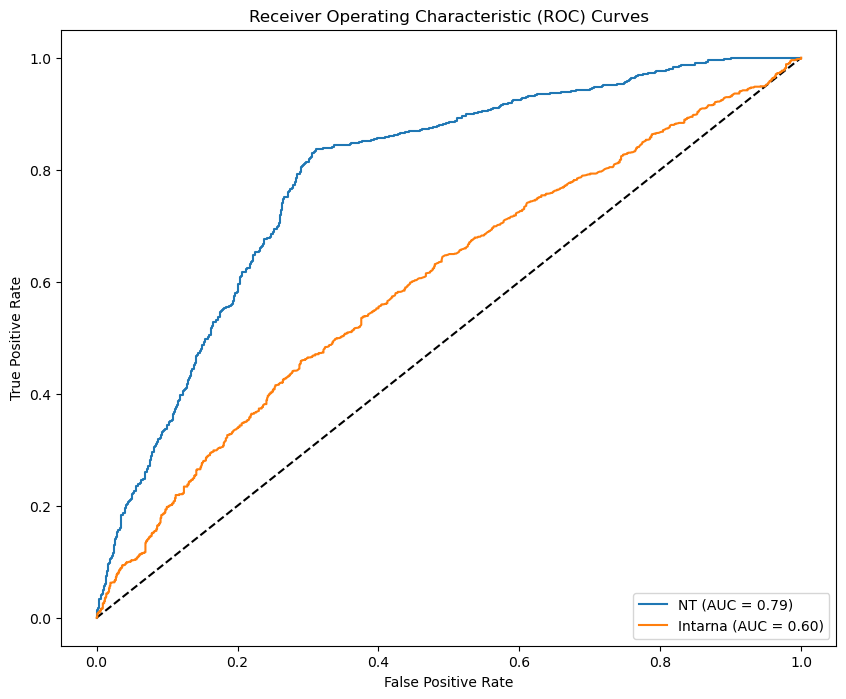

In [48]:
plot_ROC_based_on_confidence(easypos_smartneg, how = 'nt', treshold = 0.25)

Text(0.5, 0, 'Confidence & Perc%')

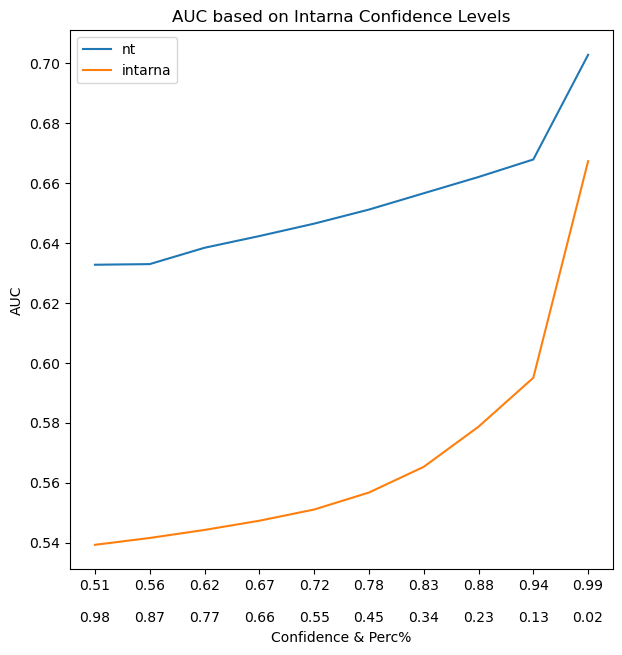

In [136]:
confidence_level, auc_nt, auc_intarna = collect_results_based_on_confidence_level(easypos_smartneg, how = 'intarna', n_values = 10)

plt.plot(confidence_level, auc_nt, label = 'nt')
plt.plot(confidence_level, auc_intarna, label = 'intarna')
plt.title('AUC based on Intarna Confidence Levels')
plt.legend()

plt.ylabel('AUC')
plt.xlabel(f"Confidence & Perc%")

Text(0.5, 0, 'Confidence & Perc%')

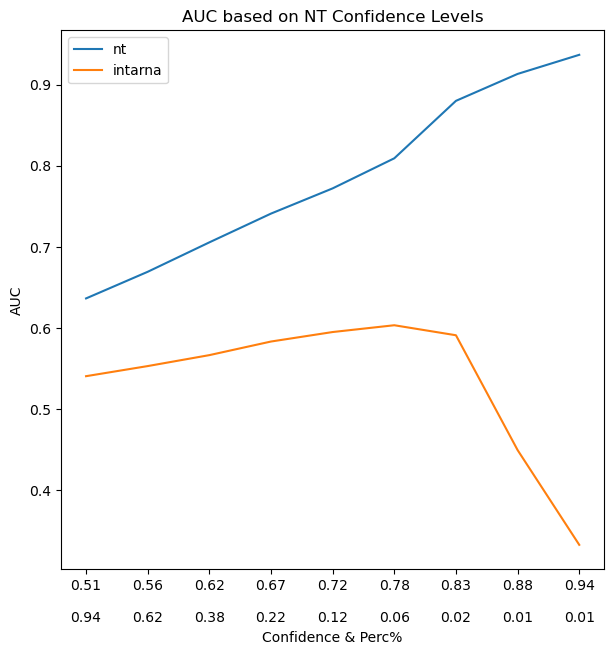

In [138]:
confidence_level, auc_nt, auc_intarna = collect_results_based_on_confidence_level(easypos_smartneg, how = 'nt', n_values = 10)

plt.plot(confidence_level, auc_nt, label = 'nt')
plt.plot(confidence_level, auc_intarna, label = 'intarna')
plt.title('AUC based on NT Confidence Levels')
plt.legend()

plt.ylabel('AUC')
plt.xlabel(f"Confidence & Perc%")

In [52]:
treshold = 0.83
subset_where_disagree = easypos_smartneg[
                (easypos_smartneg.probability >= treshold)|
                (easypos_smartneg.probability <= (1-treshold))
            ]

In [53]:
subset_where_disagree.ground_truth.value_counts()

1    337
0    305
Name: ground_truth, dtype: int64

In [54]:
diff = df_nt[['couples_id', 'diff1', 'diff2']].dropna()
new_cols = diff.couples_id.str.extractall('(.*)_(.*)').reset_index()
diff['gene1'] = new_cols[0]
diff['gene2'] = new_cols[1]
diff = pd.concat([
    diff[['gene1', 'diff1']].rename({'gene1':'gene', 'diff1':'diff'}, axis = 1),
    diff[['gene2', 'diff2']].rename({'gene2':'gene', 'diff2':'diff'}, axis = 1)
], axis = 0)
gb = diff.groupby('gene').std()
assert gb[gb['diff'] >= 0.001].shape[0] == 0
diff = diff.drop_duplicates('gene')
diff['abs_diff'] = abs(diff['diff'])

In [55]:
subset_where_disagree = subset_where_disagree.merge(diff, how = 'left', left_on = 'gene1_original', right_on = 'gene').drop(['gene','abs_diff'] , axis = 1).rename({'diff':'diff1'}, axis = 1)
subset_where_disagree = subset_where_disagree.merge(diff, how = 'left', left_on = 'gene2_original', right_on = 'gene').drop(['gene','abs_diff'] , axis = 1).rename({'diff':'diff2'}, axis = 1)
subset_where_disagree['diff1'] = subset_where_disagree['diff1'].fillna(0)
subset_where_disagree['diff2'] = subset_where_disagree['diff2'].fillna(0)
subset_where_disagree['sum_diff'] = subset_where_disagree['diff1'] + subset_where_disagree['diff2']

In [56]:
quantile_level = 0.95

problematic_genes = set(diff[diff.abs_diff> diff.abs_diff.quantile(quantile_level)].gene)

print('the percentage of problematic genes is:', np.round(len(problematic_genes)/diff.shape[0] * 100, 2))

perc = subset_where_disagree[
    subset_where_disagree.gene1_original.isin(problematic_genes)|
    subset_where_disagree.gene2_original.isin(problematic_genes)
].shape[0]/subset_where_disagree.shape[0]

print('percentage of pairs belonging to problematic genes: ', np.round(perc*100, 2))

the percentage of problematic genes is: 4.99
percentage of pairs belonging to problematic genes:  68.54


In [57]:
perc = subset_where_disagree[
    ((subset_where_disagree['sum_diff'] >= 0) & (subset_where_disagree['prediction'] == 0))|
    ((subset_where_disagree['sum_diff'] <= 0) & (subset_where_disagree['prediction'] == 1))
].shape[0]/subset_where_disagree.shape[0]

print('The percentage of pairs where the model predicts the sum of the degrees is: ', np.round(perc*100, 2))

The percentage of pairs where the model predicts the sum of the degrees is:  78.19


# Estimate bias due to genes degree

In [61]:
easypos_smartneg_sampled = easypos_smartneg_sampled.merge(diff, how = 'left', left_on = 'gene1_original', right_on = 'gene').drop(['gene','abs_diff'] , axis = 1).rename({'diff':'diff1'}, axis = 1)
easypos_smartneg_sampled = easypos_smartneg_sampled.merge(diff, how = 'left', left_on = 'gene2_original', right_on = 'gene').drop(['gene','abs_diff'] , axis = 1).rename({'diff':'diff2'}, axis = 1)
easypos_smartneg_sampled['diff1'] = easypos_smartneg_sampled['diff1'].fillna(0)
easypos_smartneg_sampled['diff2'] = easypos_smartneg_sampled['diff2'].fillna(0)
easypos_smartneg_sampled['sum_diff'] = easypos_smartneg_sampled['diff1'] + easypos_smartneg_sampled['diff2']
easypos_smartneg_sampled['abs_sum_diff'] = abs(easypos_smartneg_sampled['sum_diff'])

In [129]:
acc = []
degree = []

n_values = 250
linspace = np.linspace(0.01, easypos_smartneg_sampled.abs_sum_diff.max() + 1, n_values)
for i in range(n_values):
    subset = easypos_smartneg_sampled[easypos_smartneg_sampled.abs_sum_diff<linspace[i]]
    #subset = subset[subset.probability>0.7]
    accuracy = subset[subset.ground_truth == subset.prediction].shape[0]/subset.shape[0]
    acc.append(accuracy)
    degree.append(linspace[i])

Text(0.5, 0, 'Unbalancing level')

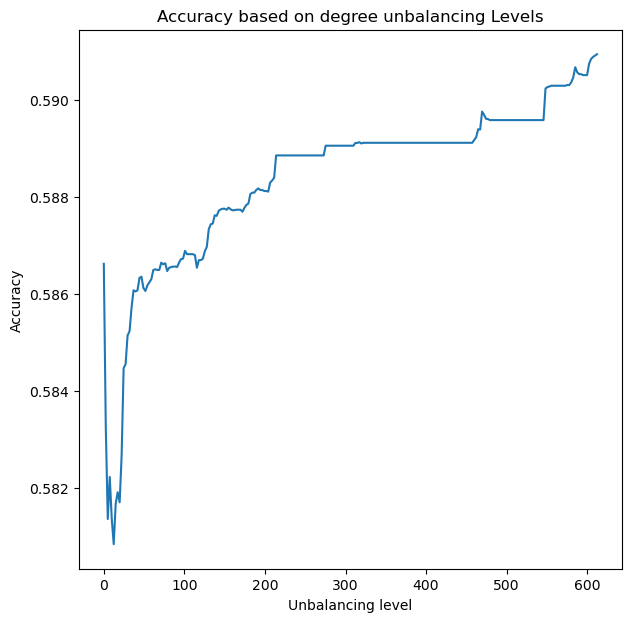

In [132]:
plt.plot(degree, acc)
plt.title('Accuracy based on degree unbalancing Levels')
         
plt.ylabel('Accuracy')
plt.xlabel('Unbalancing level')

# XAI

In [121]:
df_genes_nt = pd.read_csv(os.path.join(metadata_dir, f'df_genes_nt.csv'))

DEVICE = 'cpu'

args_path = os.path.join(checkpoint_dir, 'args.pkl')

# Load the args namespace from the file
with open(args_path, 'rb') as f:
    args_dict = pickle.load(f)

# Convert the dictionary to an argparse.Namespace object
args = argparse.Namespace(**args_dict)
args.resume = os.path.join(checkpoint_dir, 'best_model.pth') # best_model

device = torch.device(DEVICE)
model = build_model(args)

checkpoint = torch.load(args.resume, map_location='cpu')
model.load_state_dict(checkpoint['model'])

model.to(device)
model.eval()

def plot_query_results(query):
    for _, row in query.iterrows():
        x1_emb, x2_emb, y1_emb, y2_emb = int(np.round(row.x1/6)), int(np.round(row.x2/6)), int(np.round(row.y1/6)), int(np.round(row.y2/6))

        embedding1_path = os.path.join(embedding_dir, '32', row.gene1+'.npy')
        embedding2_path = os.path.join(embedding_dir, '32', row.gene2+'.npy')

        embedding1 = np.load(embedding1_path)[x1_emb:x2_emb, :]
        embedding2 = np.load(embedding2_path)[y1_emb:y2_emb, :]

        rna1, rna2 = torch.as_tensor(embedding1).unsqueeze(0), torch.as_tensor(embedding2).unsqueeze(0)
        rna1, rna2 = torch.transpose(rna1, 1, 2), torch.transpose(rna2, 1, 2)

        rna1, rna2 = rna1.to(device), rna2.to(device)

        outputs = model(rna1, rna2)

        outputs[:, 1].backward()
        print('prob:', outputs.softmax(-1)[:, 1])
        print('degree:', row.abs_sum_diff)
        x1 = int(row.seed_x1-row.x1)
        x2 = int(row.seed_x2-row.x1)
        y1 = int(row.seed_y1-row.y1)
        y2 = int(row.seed_y2-row.y1)
        width = row.len1
        height = row.len2

        expl_matrix = gradcam(model, rna1, rna2, counterfactual = False, cnn_layer = 2)
        expl_matrix_reshaped = interpolate_expl_matrix(expl_matrix, height, width)

        scaling_factor = 70

        plot_matrix(expl_matrix_reshaped, 
        ''.join(['C'for i in range(width)]), 
        ''.join(['C'for i in range(height)]), 
        [[x1, y1, x2-x1, y2-y1]], #crop_bbox =[x1hat, y1hat, what, hhat], 
        cmap ='viridis', 
        scaling_factor = scaling_factor)
        plt.show()

/data01/giorgio/ENTER/envs/rnarna/lib/python3.10/site-packages/torch/nn/init.py:405: UserWarning: Initializing zero-element tensors is a no-op
  warnings.warn("Initializing zero-element tensors is a no-op")


In [95]:
xai = pd.read_csv(os.path.join(checkpoint_dir, 'gradcam_results500.csv'))

In [96]:
xai = xai.merge(res.filter([
    'couples', 'gene1_pc', 'gene2_pc', 'original_length1', 'original_length2', 'id_sample', 'g1', 'g2', 'gene1_original', 'gene2_original'
], axis = 1), left_on = 'id', right_on = 'id_sample')

In [97]:
gradcam_results = xai[xai.probability>0.5]

iou_value: 0.006
iou_value_tr: 0.0058
iou_value_rand: 0.0029


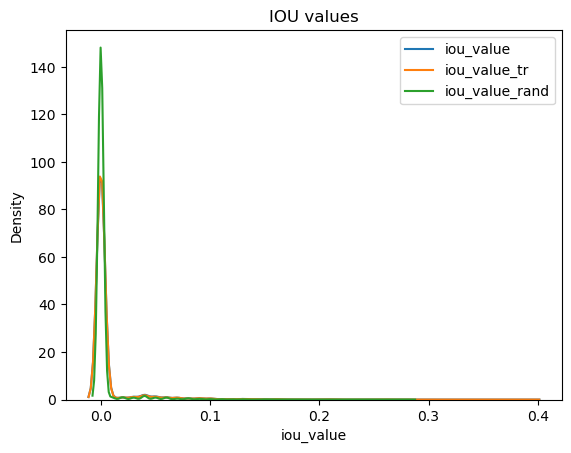

intensity: 0.3975
intensity_tr: 0.15
intensity_rand: 0.5


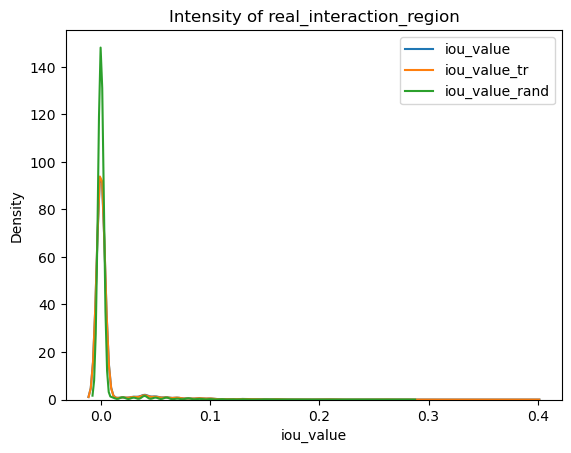

euclidean: 0.4783
euclidean_rand: 0.5324
euclidean_bbox_tr: 0.4918


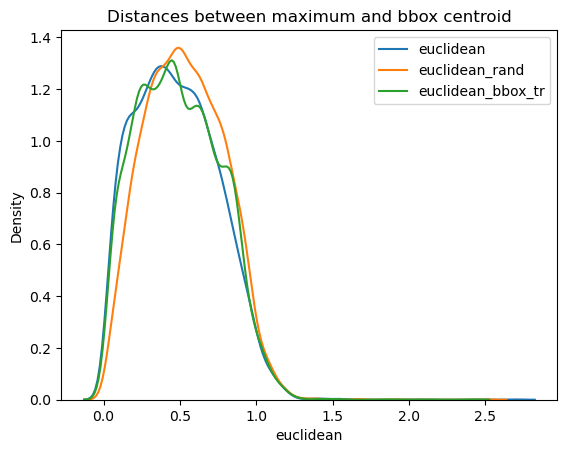

cos_sim: 0.06
cos_sim_tr: 0.04
cos_sim_rand: 0.04


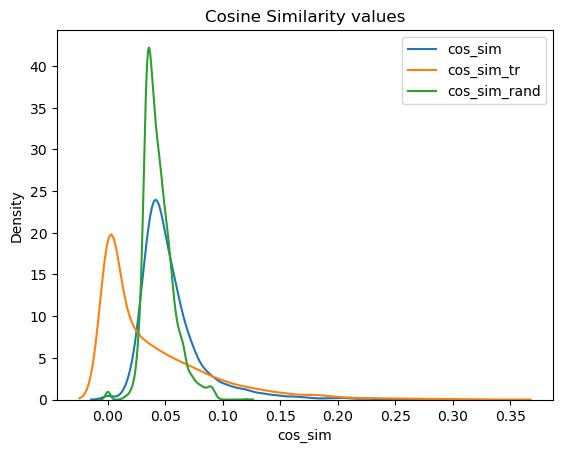

In [98]:
iou_columns = ['iou_value', 'iou_value_tr', 'iou_value_rand']
for c in iou_columns:
    print(f'{c}: {str(np.round(gradcam_results[c].mean(), 4))}')

for c in iou_columns:
    sns.kdeplot(gradcam_results[c], label = c)
plt.title(f'IOU values')
plt.legend()
plt.show()

intensity_columns = ['intensity', 'intensity_tr', 'intensity_rand']
for c in intensity_columns:
    print(f'{c}: {str(np.round(gradcam_results[c].mean(), 4))}')

for c in iou_columns:
    sns.kdeplot(gradcam_results[c], label = c)
    
plt.title(f'Intensity of real_interaction_region')
plt.legend()
plt.show()

euclidean_columns = ['euclidean', 'euclidean_rand', 'euclidean_bbox_tr']
for c in euclidean_columns:
    print(f'{c}: {str(np.round(gradcam_results[c].mean(), 4))}')

for c in euclidean_columns:
    sns.kdeplot(gradcam_results[c], label = c)
plt.title(f'Distances between maximum and bbox centroid')
plt.legend()
plt.show()

cosine_sim_columns = ['cos_sim', 'cos_sim_tr', 'cos_sim_rand']
for c in cosine_sim_columns:
    print(f'{c}: {str(np.round(gradcam_results[c].mean(), 2))}')

for c in cosine_sim_columns:
    sns.kdeplot(gradcam_results[c], label = c)
plt.title(f'Cosine Similarity values')
plt.legend()
plt.show()

#### Subset XAI results

In [99]:
df_nt = pd.read_csv(os.path.join(metadata_dir, f'df_nt.csv'))
regex = df_nt[df_nt.couples.isin(gene_pairs_train)].couples_id.str.extractall('(.*)_(.*)').reset_index()
df_train = regex
df_train['g1'] = regex[0]
df_train['g2'] = regex[1]
df_train_genes = set(df_train['g1']).union(set(df_train['g2']))

/tmp/ipykernel_574185/2875514386.py:1: DtypeWarning: Columns (21) have mixed types. Specify dtype option on import or set low_memory=False.
  df_nt = pd.read_csv(os.path.join(metadata_dir, f'df_nt.csv'))


euclidean: 0.3868
euclidean_rand: 0.5919


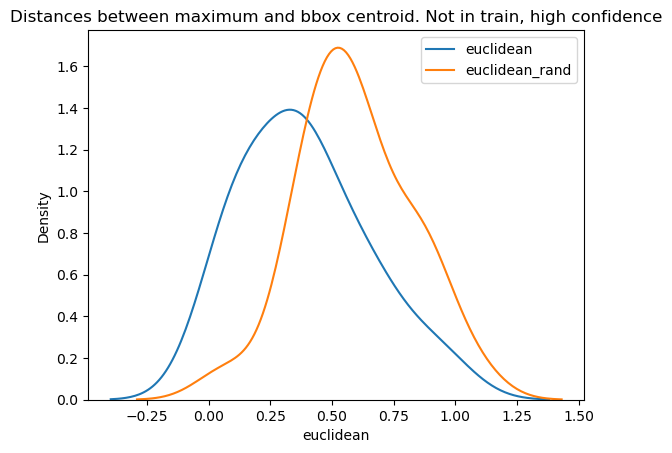

In [100]:
gradcam_results = xai[~(xai.gene1_original.isin(df_train_genes) | xai.gene2_original.isin(df_train_genes))]
gradcam_results = gradcam_results[(gradcam_results.probability>0.65)&(gradcam_results.probability<0.8)]

euclidean_columns = ['euclidean', 'euclidean_rand']
for c in euclidean_columns:
    print(f'{c}: {str(np.round(gradcam_results[c].mean(), 4))}')

for c in euclidean_columns:
    sns.kdeplot(gradcam_results[c], label = c)
plt.title(f'Distances between maximum and bbox centroid. Not in train, high confidence')
plt.legend()
plt.show()

tensor([0.6823], grad_fn=<SelectBackward0>)


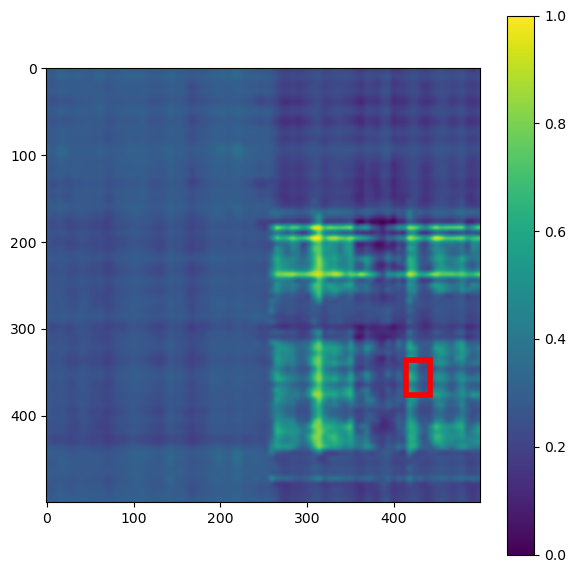

tensor([0.6970], grad_fn=<SelectBackward0>)


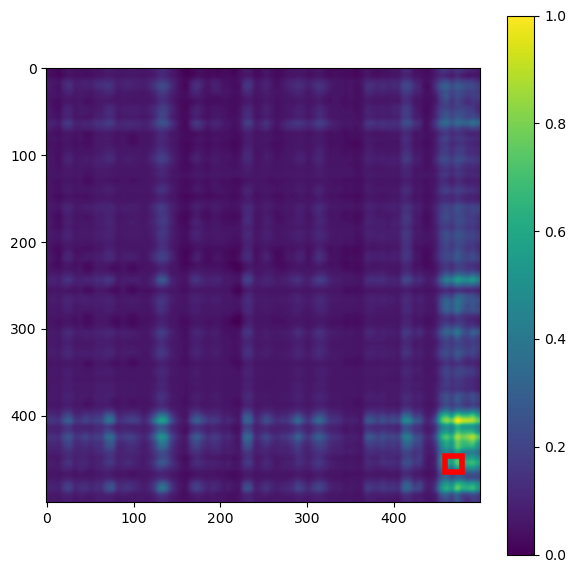

tensor([0.6889], grad_fn=<SelectBackward0>)


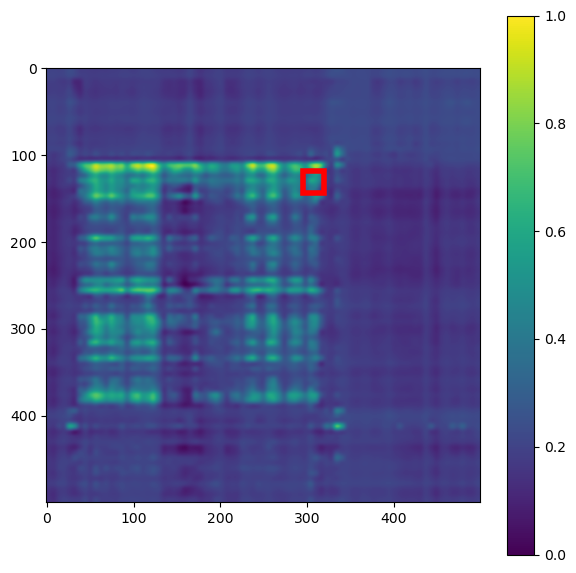

tensor([0.7940], grad_fn=<SelectBackward0>)


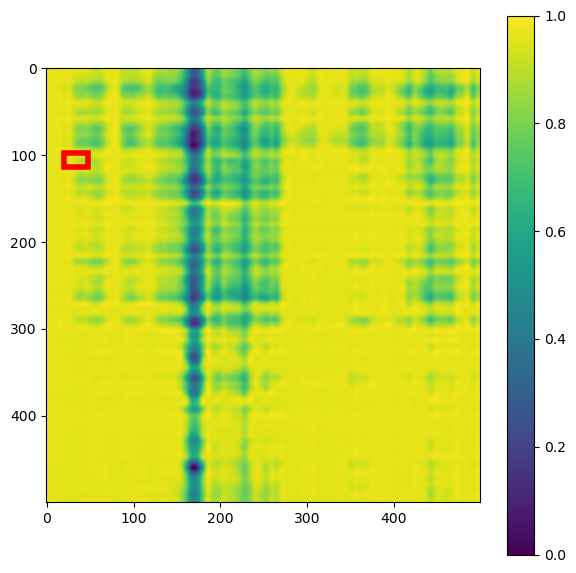

tensor([0.7759], grad_fn=<SelectBackward0>)


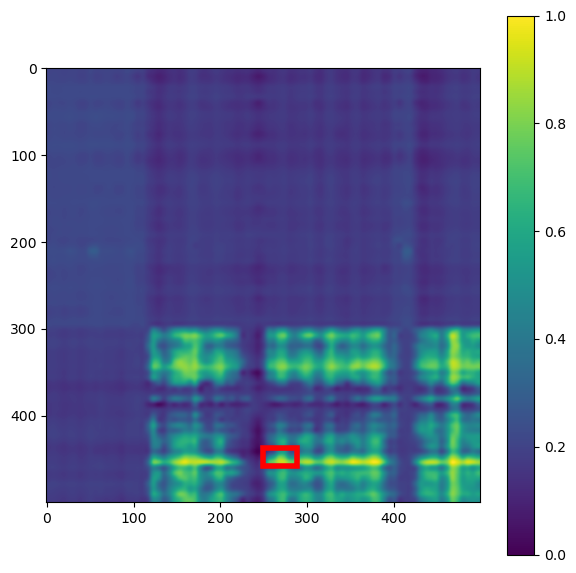

tensor([0.6552], grad_fn=<SelectBackward0>)


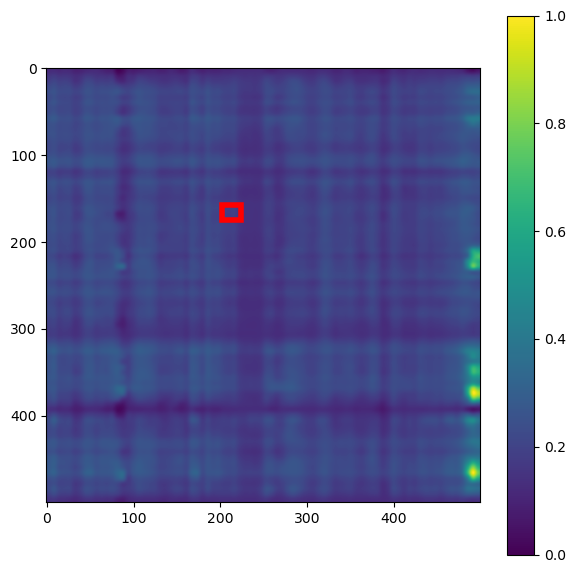

tensor([0.6630], grad_fn=<SelectBackward0>)


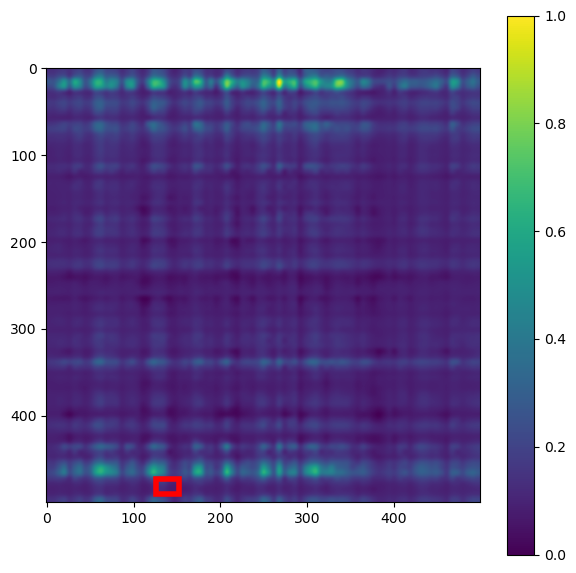

tensor([0.6953], grad_fn=<SelectBackward0>)


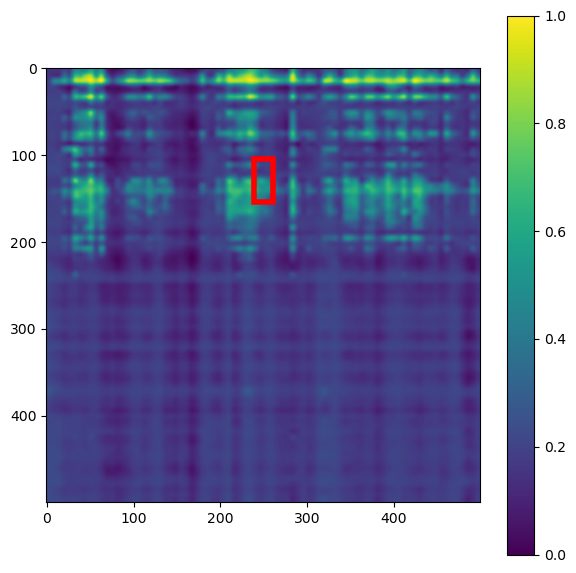

tensor([0.6740], grad_fn=<SelectBackward0>)


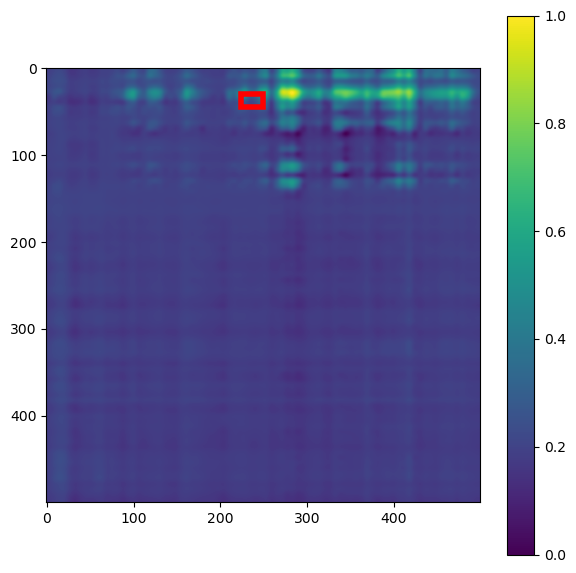

tensor([0.6997], grad_fn=<SelectBackward0>)


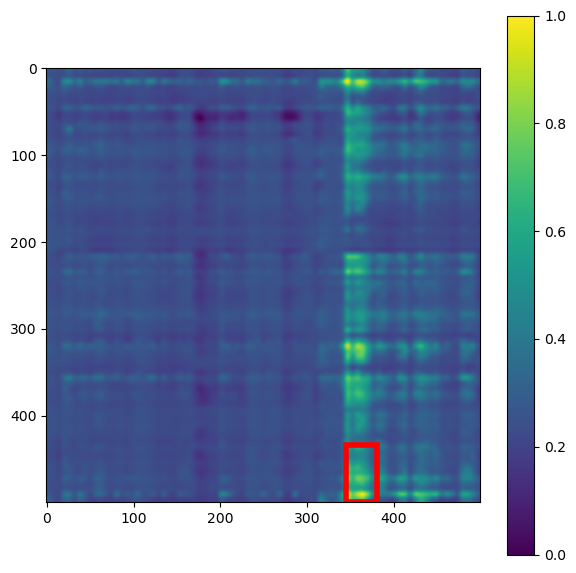

tensor([0.7165], grad_fn=<SelectBackward0>)


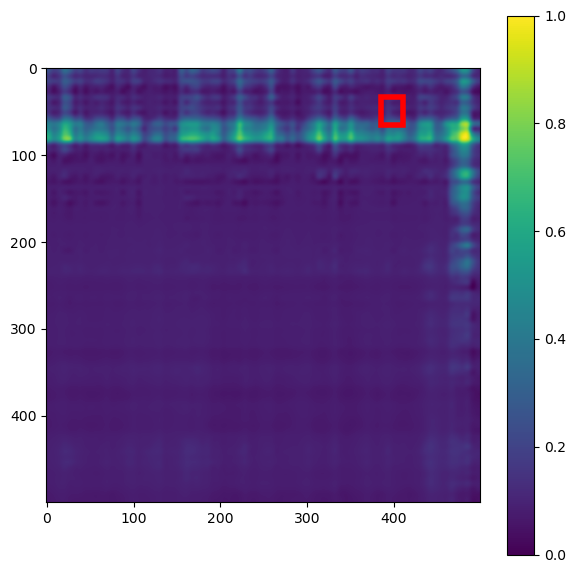

tensor([0.6974], grad_fn=<SelectBackward0>)


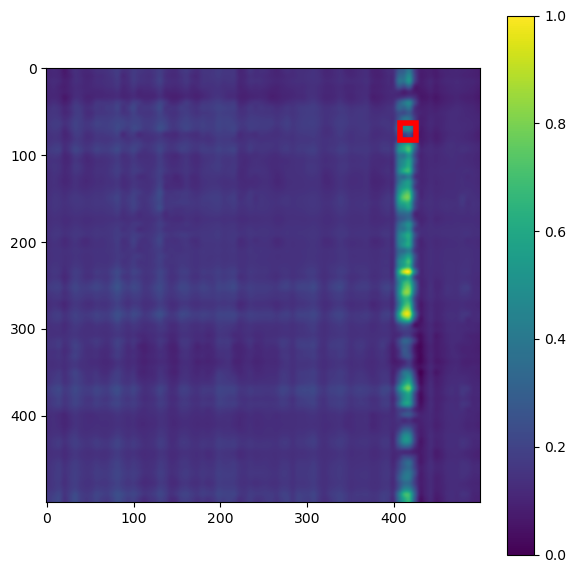

tensor([0.6832], grad_fn=<SelectBackward0>)


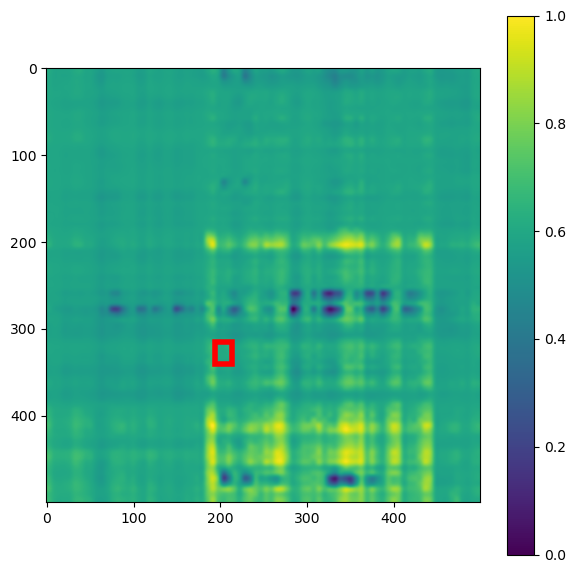

tensor([0.6875], grad_fn=<SelectBackward0>)


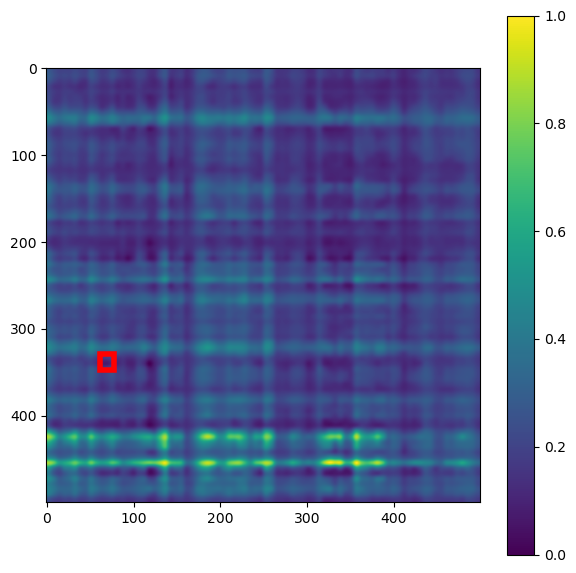

tensor([0.7736], grad_fn=<SelectBackward0>)


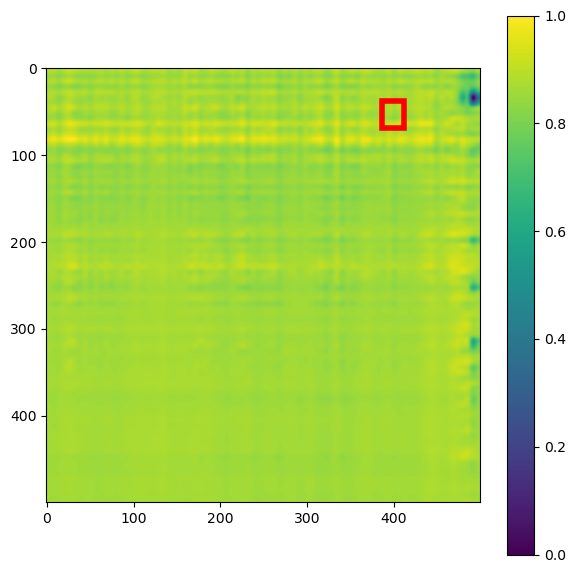

tensor([0.6910], grad_fn=<SelectBackward0>)


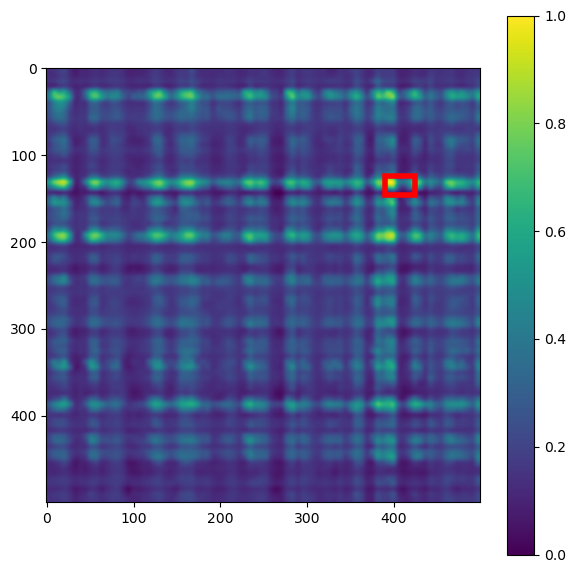

tensor([0.7067], grad_fn=<SelectBackward0>)


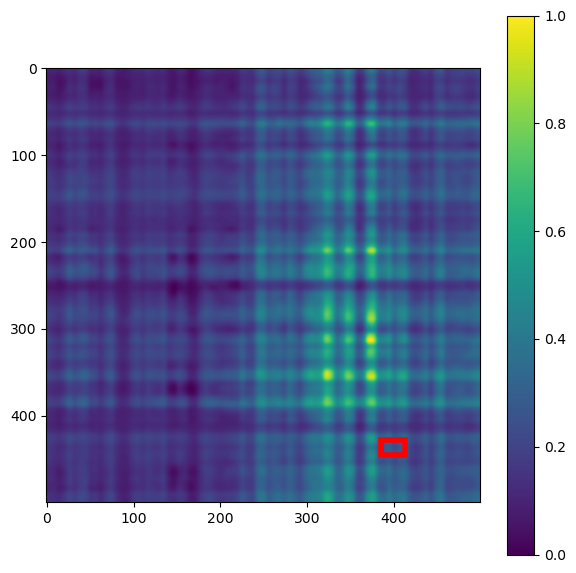

tensor([0.6970], grad_fn=<SelectBackward0>)


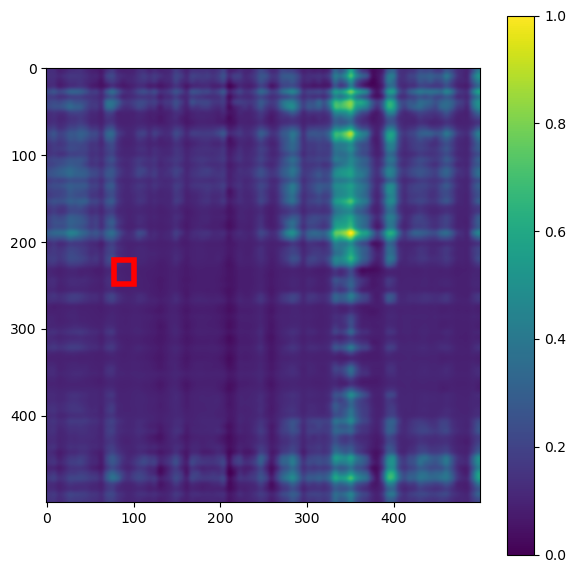

tensor([0.6996], grad_fn=<SelectBackward0>)


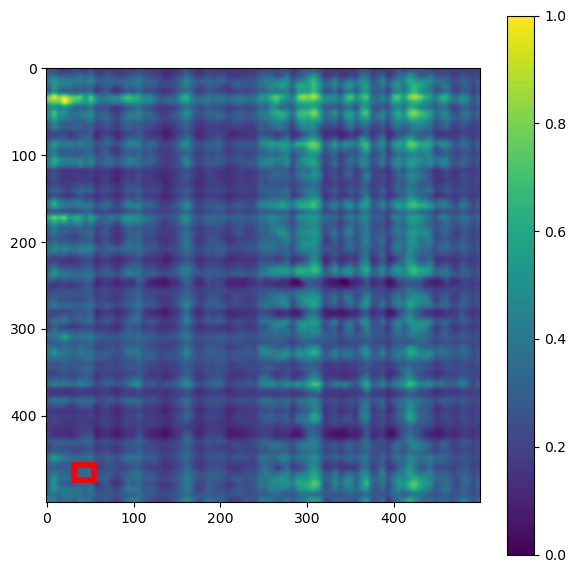

tensor([0.7779], grad_fn=<SelectBackward0>)


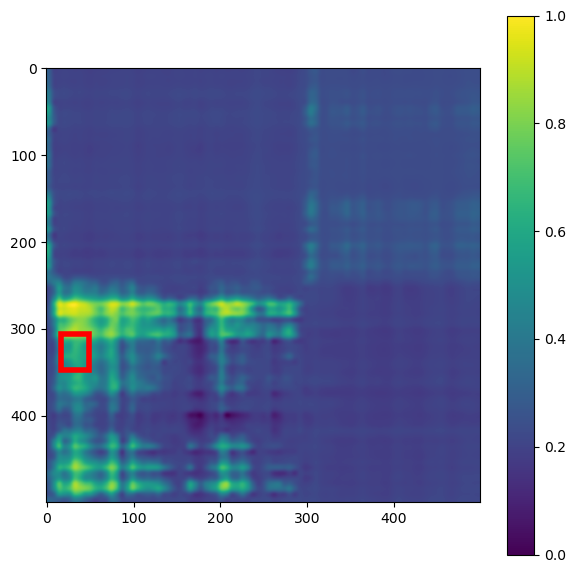

tensor([0.7055], grad_fn=<SelectBackward0>)


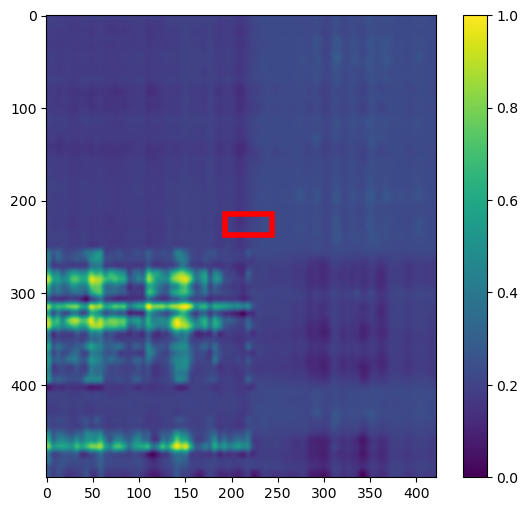

tensor([0.7427], grad_fn=<SelectBackward0>)


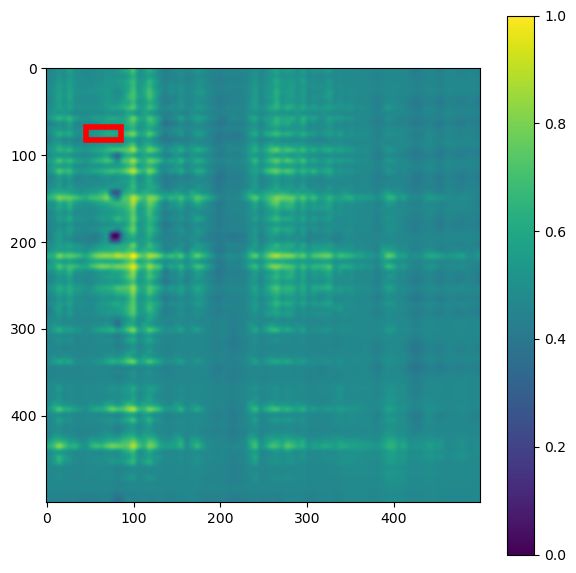

tensor([0.7824], grad_fn=<SelectBackward0>)


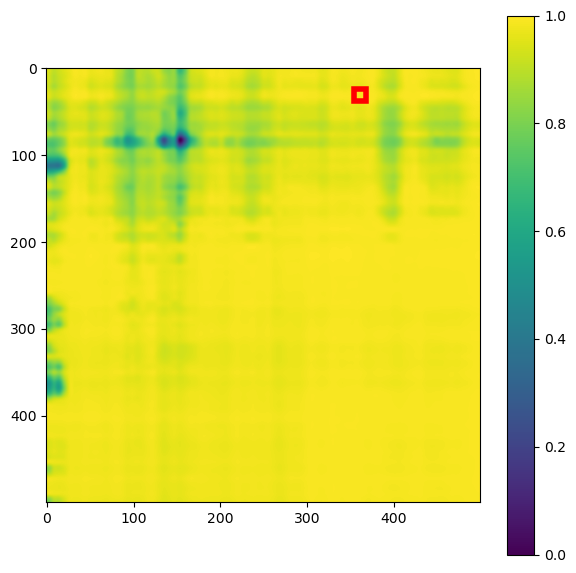

In [115]:
query = test500[test500.couples.isin(list(gradcam_results.id))]
plot_query_results(query)

euclidean: 0.4234
euclidean_rand: 0.5464


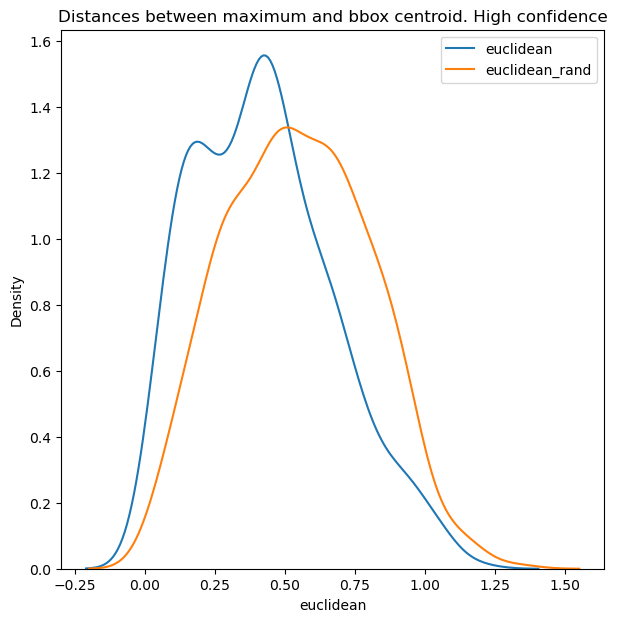

In [117]:
gradcam_results = xai[(xai.probability>0.75)&(xai.probability<0.79)]

euclidean_columns = ['euclidean', 'euclidean_rand']
for c in euclidean_columns:
    print(f'{c}: {str(np.round(gradcam_results[c].mean(), 4))}')

for c in euclidean_columns:
    sns.kdeplot(gradcam_results[c], label = c)
plt.title(f'Distances between maximum and bbox centroid. High confidence')
plt.legend()
plt.show()

prob: tensor([0.7836], grad_fn=<SelectBackward0>)
degree: 11.886461003005856


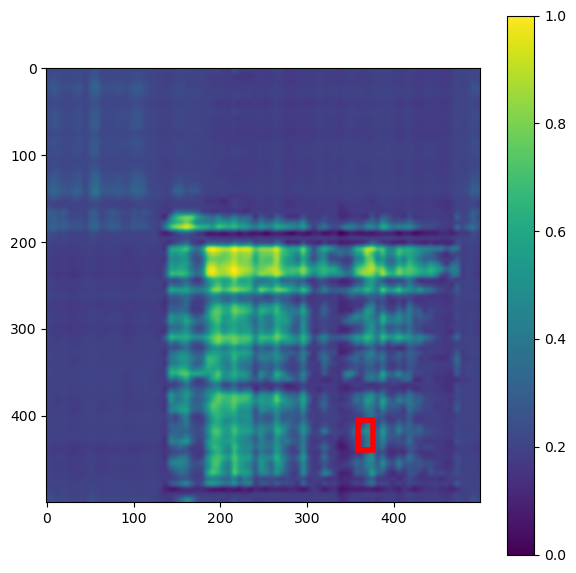

prob: tensor([0.7770], grad_fn=<SelectBackward0>)
degree: 0.0603005853504186


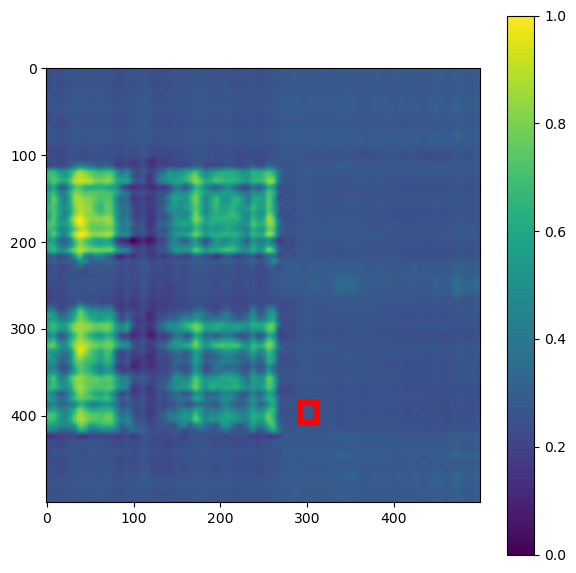

prob: tensor([0.7601], grad_fn=<SelectBackward0>)
degree: 13.234140167694983


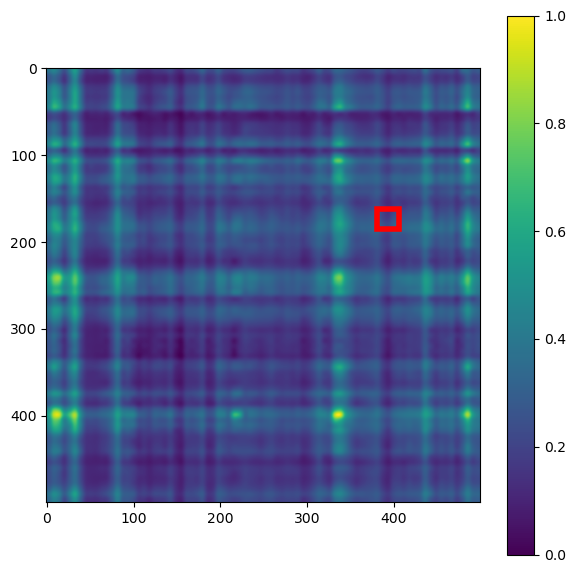

prob: tensor([0.7883], grad_fn=<SelectBackward0>)
degree: 28.584173390286352


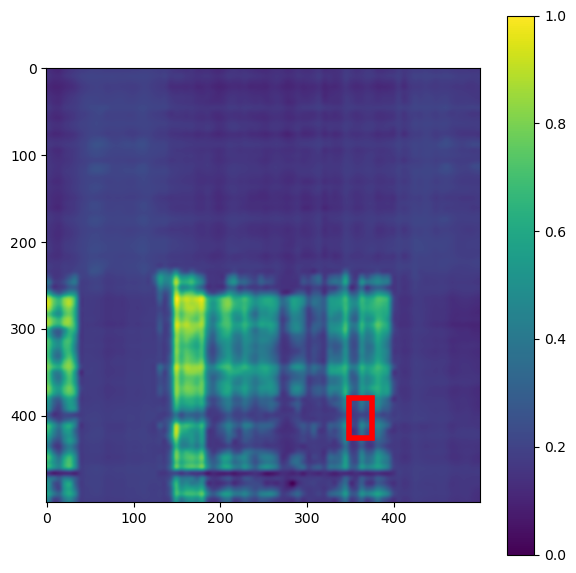

prob: tensor([0.7534], grad_fn=<SelectBackward0>)
degree: 2.294440753045404


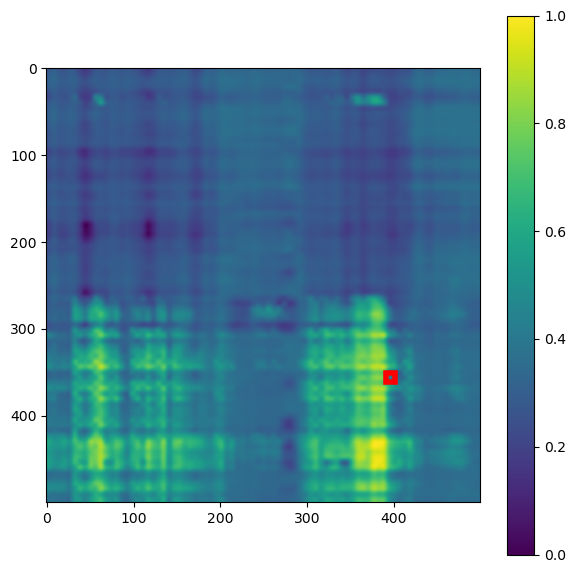

prob: tensor([0.7809], grad_fn=<SelectBackward0>)
degree: 22.409549121974372


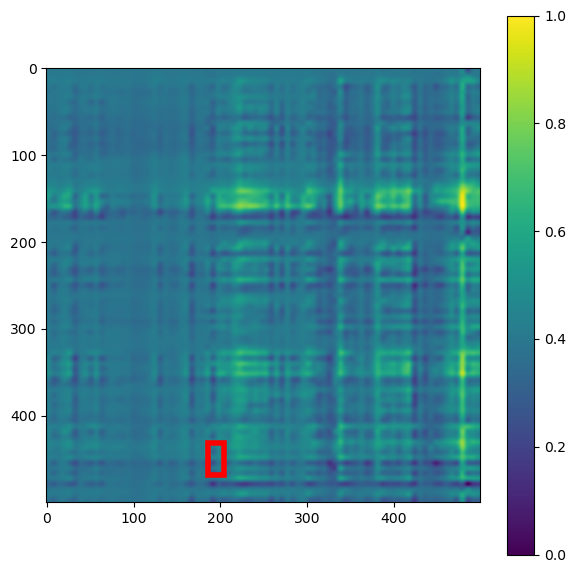

prob: tensor([0.7606], grad_fn=<SelectBackward0>)
degree: 1.2960101249802234


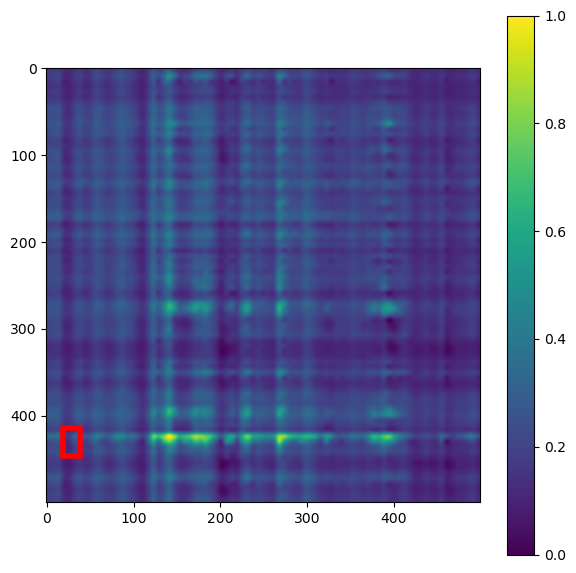

prob: tensor([0.7538], grad_fn=<SelectBackward0>)
degree: 4.46749564942256


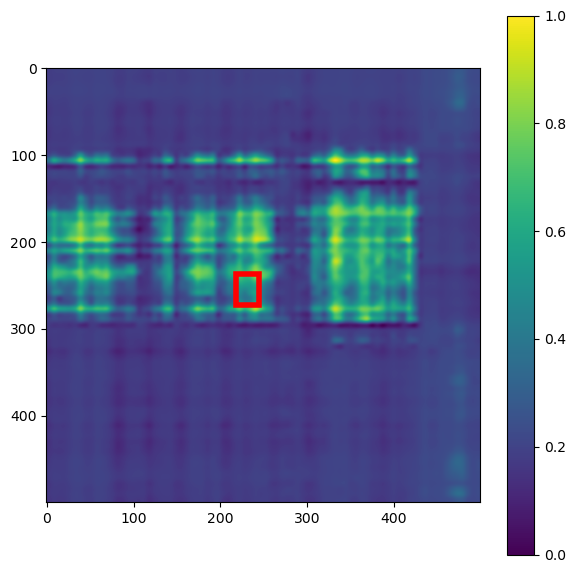

prob: tensor([0.7896], grad_fn=<SelectBackward0>)
degree: 5.999215314032591


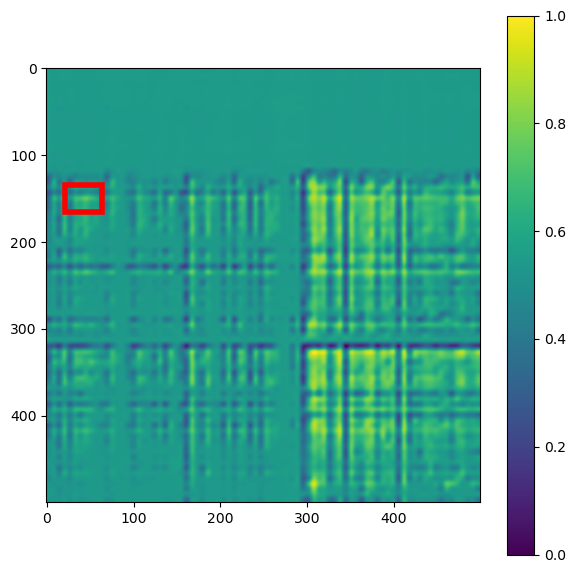

prob: tensor([0.7535], grad_fn=<SelectBackward0>)
degree: 1.646828033538997


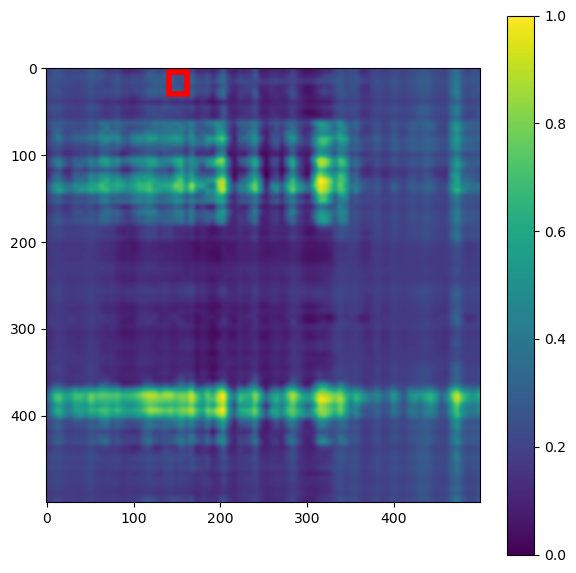

prob: tensor([0.7717], grad_fn=<SelectBackward0>)
degree: 9.761151716500557


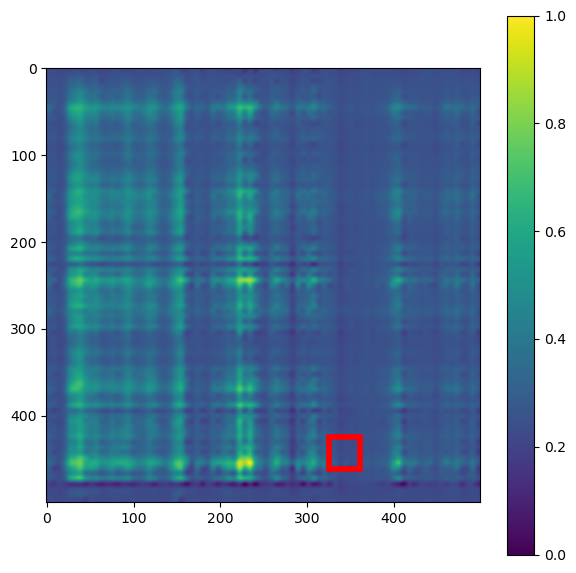

prob: tensor([0.7570], grad_fn=<SelectBackward0>)
degree: 3.058731213415599


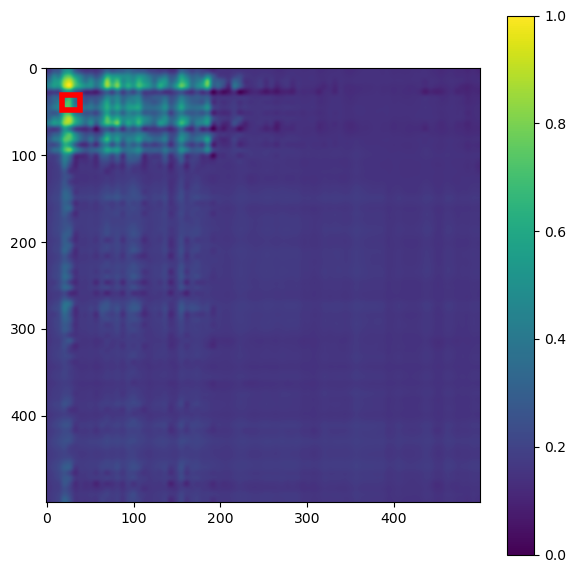

prob: tensor([0.7629], grad_fn=<SelectBackward0>)
degree: 3.880968201233984


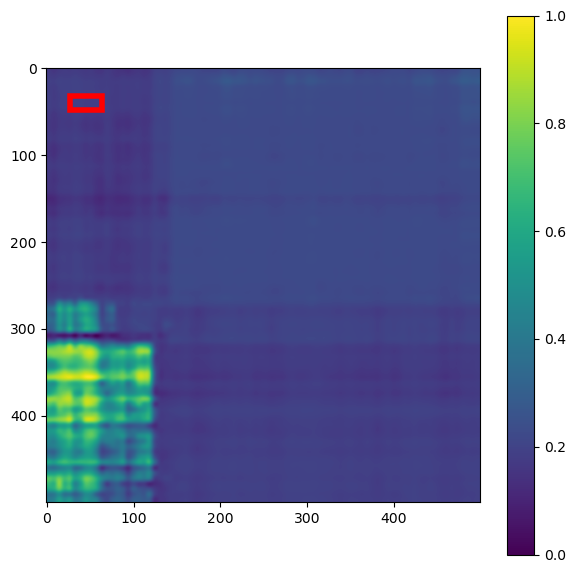

prob: tensor([0.7762], grad_fn=<SelectBackward0>)
degree: 12.763505774402782


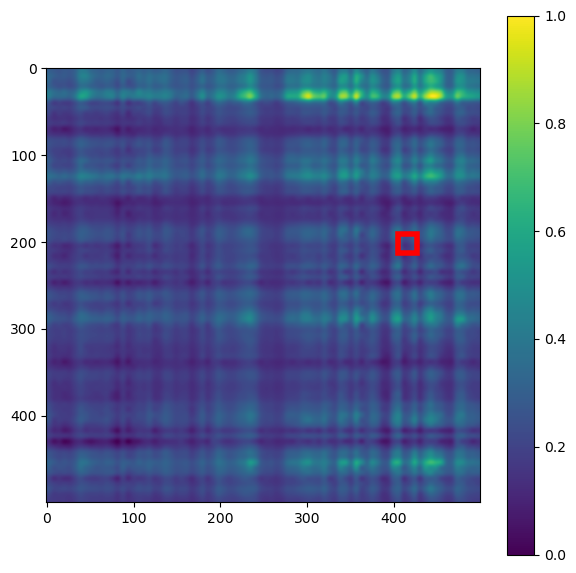

prob: tensor([0.7495], grad_fn=<SelectBackward0>)
degree: 2.823806359753203


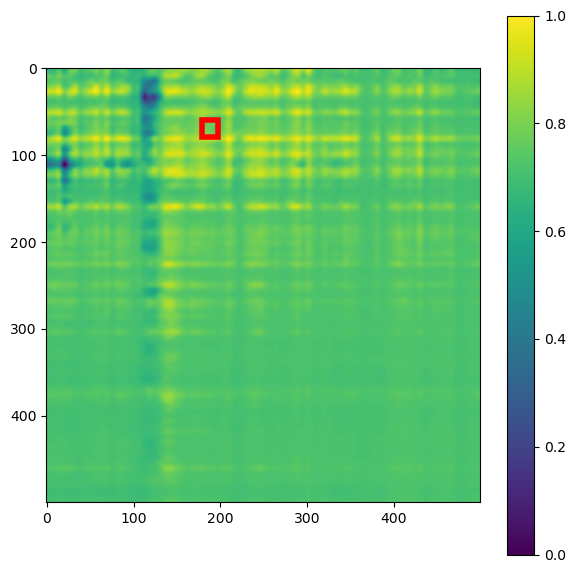

prob: tensor([0.7638], grad_fn=<SelectBackward0>)
degree: 4.46749564942256


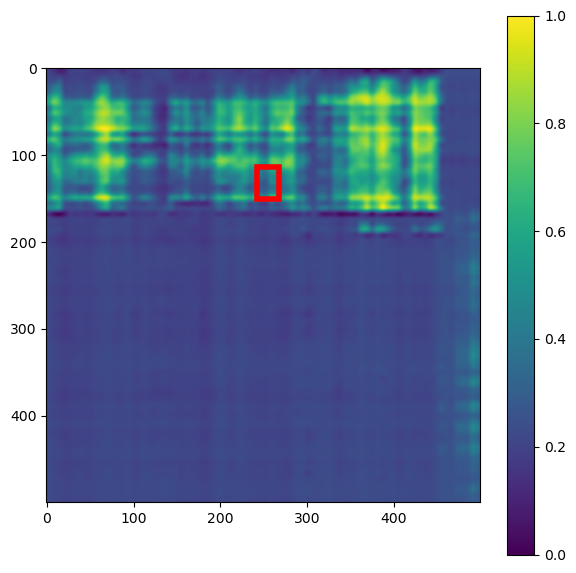

prob: tensor([0.7928], grad_fn=<SelectBackward0>)
degree: 0.5301502926752093


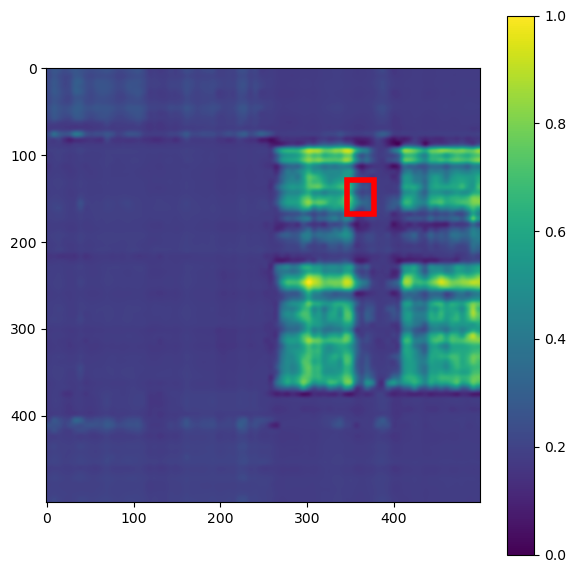

prob: tensor([0.7756], grad_fn=<SelectBackward0>)
degree: 128.40013289036546


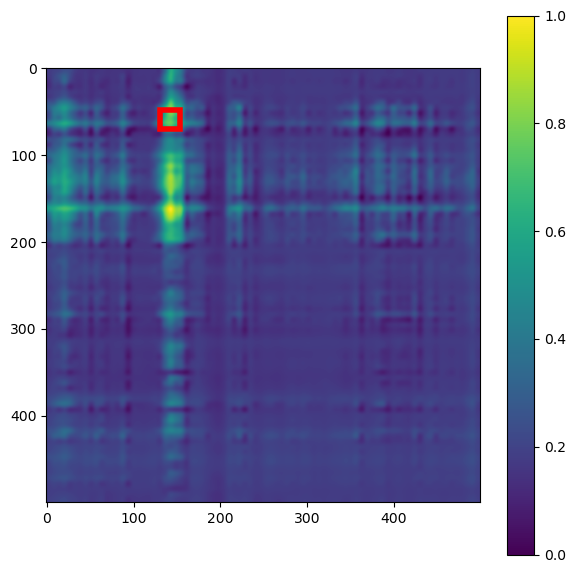

prob: tensor([0.7600], grad_fn=<SelectBackward0>)
degree: 0.4119031798766018


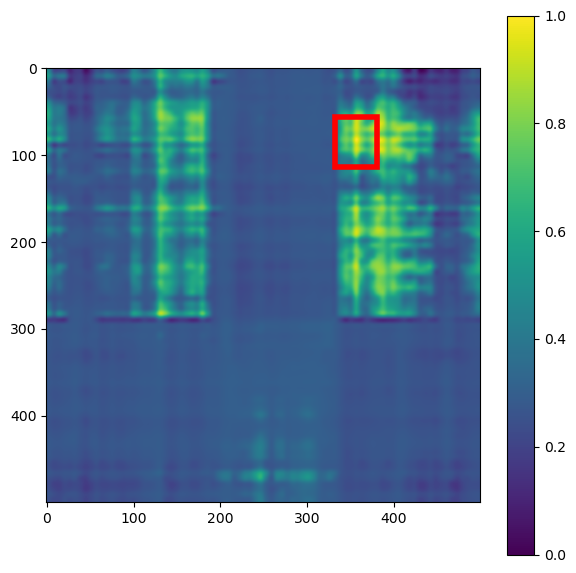

prob: tensor([0.7600], grad_fn=<SelectBackward0>)
degree: 3.2357095396298052


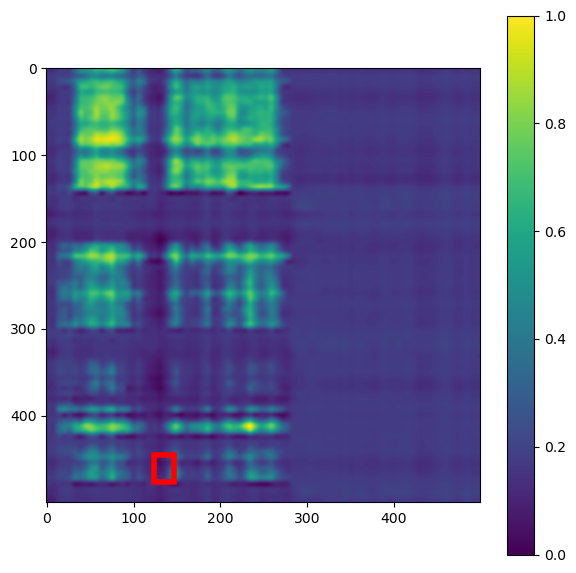

prob: tensor([0.7812], grad_fn=<SelectBackward0>)
degree: 14.174624268311977


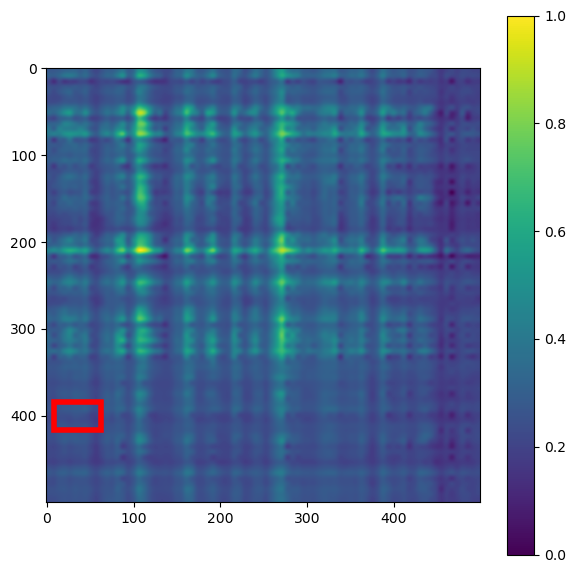

prob: tensor([0.7791], grad_fn=<SelectBackward0>)
degree: 15.880183515266571


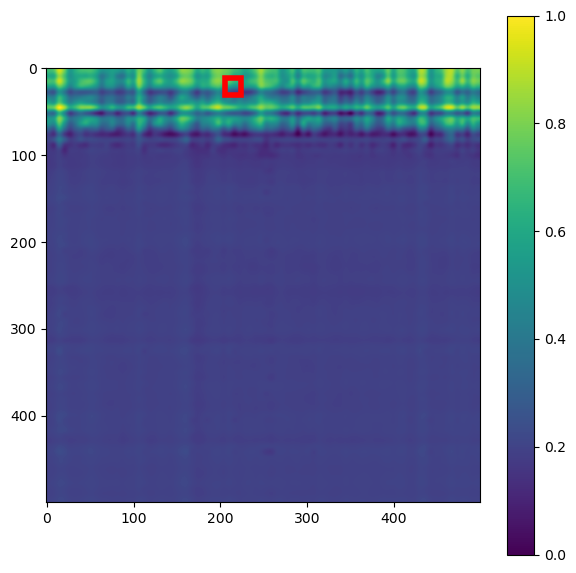

prob: tensor([0.7807], grad_fn=<SelectBackward0>)
degree: 14.291302009175766


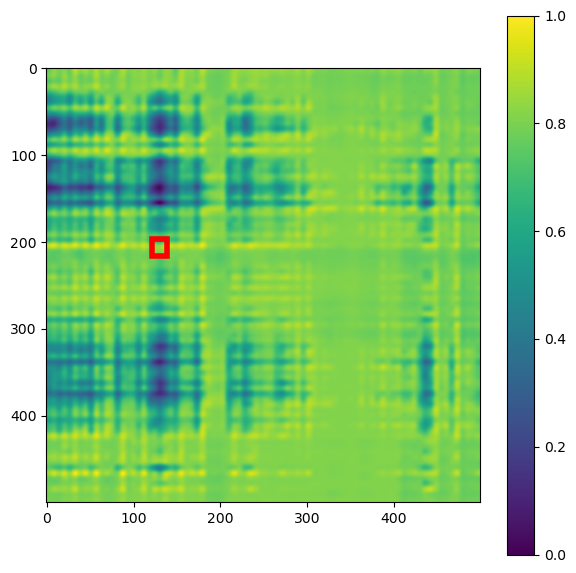

prob: tensor([0.7557], grad_fn=<SelectBackward0>)
degree: 1.6476127195064065


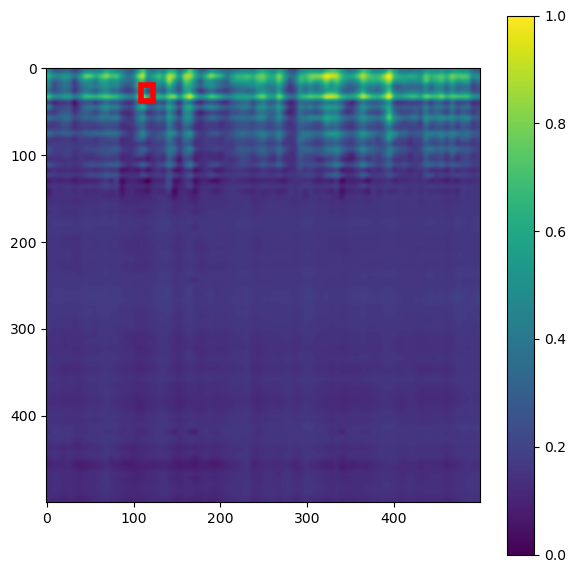

prob: tensor([0.7667], grad_fn=<SelectBackward0>)
degree: 585.7680936560671


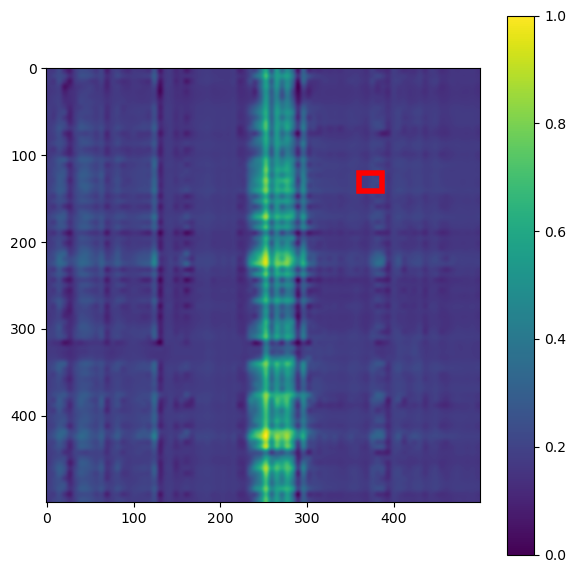

In [123]:
query = test500[test500.couples.isin(list(gradcam_results.id))].reset_index(drop = True)
query['gene1_original'] = query.gene1.str.extractall('(.*)_(.*)_(.*)').reset_index()[0]
query['gene2_original'] = query.gene2.str.extractall('(.*)_(.*)_(.*)').reset_index()[0]
query = query.merge(diff, how = 'left', left_on = 'gene1_original', right_on = 'gene').drop(['gene','abs_diff'] , axis = 1).rename({'diff':'diff1'}, axis = 1)
query = query.merge(diff, how = 'left', left_on = 'gene2_original', right_on = 'gene').drop(['gene','abs_diff'] , axis = 1).rename({'diff':'diff2'}, axis = 1)
query['diff1'] = query['diff1'].fillna(0)
query['diff2'] = query['diff2'].fillna(0)
query['sum_diff'] = query['diff1'] + query['diff2']
query['abs_sum_diff'] = abs(query['sum_diff'])
plot_query_results(query.head(25))